In [1]:
# Reload dependencies upon changes
%load_ext autoreload
%load_ext line_profiler
%autoreload 2

## Dependencies

In [2]:
from functools import partial
from copy import deepcopy
from itertools import product
import typing
import sys

import numpy as np
import gym
import tqdm
import matplotlib.pyplot as plt
import line_profiler

from mazelab_experimenter import EnvRegister
from mazelab_experimenter import AgentShelve
from mazelab_experimenter import benchmark, GenericOuterHook, PredictionErrorHook
from mazelab_experimenter.utils import compute_optimal_value

In [3]:
EnvRegister.get_types()

['contracted_gridworld',
 'double_t_maze',
 'dyna_example',
 'four_rooms',
 'four_rooms_HierQ',
 'gridworld',
 'morris_water_maze',
 'n_rooms_square',
 'open_world',
 'prebuilts',
 'random_maze',
 'random_shape_maze',
 't_maze',
 'u_maze']

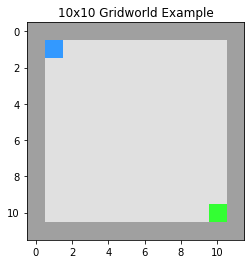

In [4]:
name_gridworld = EnvRegister.register(
    maze_type='gridworld', 
    name=f'gridworld-v0', 
    env_args=dict(
        binary_rewards=True
    ),
    generator_args=dict(height=12, width=12),
    initialization_args=dict(
        start_pos=[[1, 1]], goal_pos=[[10, 10]]
    ),
    time_limit=10000,
    override=True
)
gridworld = gym.make(name_gridworld)

# Illustrate the randomly generated maze. 
_ = gridworld.reset()

img_a = gridworld.unwrapped.get_image()
gridworld.close()

plt.imshow(img_a)
plt.title("10x10 Gridworld Example")

plt.show()

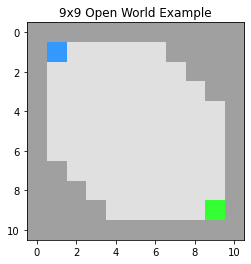

In [5]:
name_openworld = EnvRegister.register(
    maze_type='open_world', 
    name=f'gridworld-v1', 
    env_args=dict(
        binary_rewards=True
    ),
    generator_args=dict(),
    initialization_args=dict(
        start_pos=[[1, 1]], goal_pos=[[9, 9]]
    ),
    time_limit=10000,
    override=True
)
open_world = gym.make(name_openworld)

# Illustrate the randomly generated maze. 
_ = open_world.reset()

img_a = open_world.unwrapped.get_image()
open_world.close()

plt.imshow(img_a)
plt.title("9x9 Open World Example")

plt.show()

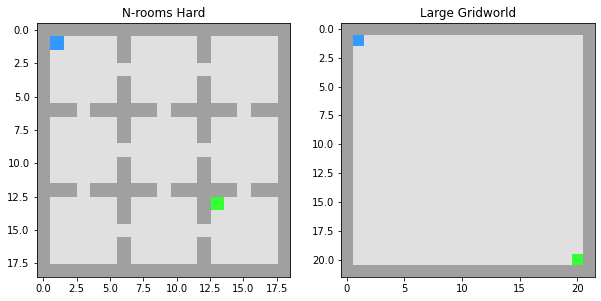

In [6]:
t = 10000

name_n_rooms = EnvRegister.register(
    maze_type='n_rooms_square', 
    name=f'n_rooms_hierq-v0', 
    env_args=dict(
        binary_rewards=True
    ),
    generator_args=dict(num_rooms=9, room_size=5, gap_size=1),
    initialization_args=dict(
        start_pos=[[1, 1]], goal_pos=[[13, 13]]
    ),
    time_limit=t,
    override=True
)

name_gridworld100 = EnvRegister.register(
    maze_type='gridworld', 
    name=f'gridworld_hierq-v1', 
    env_args=dict(
        binary_rewards=True
    ),
    generator_args=dict(height=22, width=22),
    initialization_args=dict(
        start_pos=[[1, 1]], goal_pos=[[20, 20]]
    ),
    time_limit=t,
    override=True
)

# Instantiate the registered MazeLab environment as a Gym environment.
n_rooms = gym.make(name_n_rooms)
largegrid = gym.make(name_gridworld100)

# Illustrate the randomly generated maze. 
_ = n_rooms.reset(), largegrid.reset()

img_a, img_b = n_rooms.unwrapped.get_image(), largegrid.unwrapped.get_image()

n_rooms.close()
largegrid.close()

f, axarr = plt.subplots(1, 2, figsize=(10, 5))

axarr[0].imshow(img_a)
axarr[0].set_title("N-rooms Hard")

axarr[1].imshow(img_b)
axarr[1].set_title("Large Gridworld")

plt.show()

In [7]:
AgentShelve.get_types()

['TabularQLearner',
 'TabularQLearnerN',
 'TabularQLambda',
 'TabularQET',
 'TabularDynaQ',
 'MonteCarloQLearner',
 'RandomAgent',
 'HierQ',
 'HierQV2',
 'HierQN',
 'HierQTD',
 'HierQTS',
 'HierQLambda']

In [8]:
AgentShelve.get_keyword_args('TabularQLearnerN')

<Signature (observation_shape: 'typing.Tuple[int, int]', n_actions: 'int', lr: 'float' = 0.5, n_steps: 'int' = 1, epsilon: 'float' = 0.1, discount: 'float' = 0.95, sarsa: 'bool' = False, optimal: 'bool' = True, q_init: 'float' = 0.0, **kwargs) -> 'None'>

In [9]:
from mazelab.solvers import dijkstra_solver

In [306]:
s = compute_optimal_value(n_rooms)

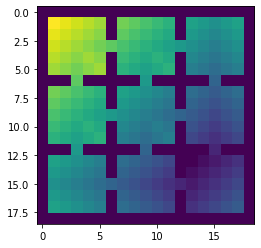

In [11]:
plt.imshow(s.reshape(n_rooms.observation_space.shape))

In [308]:
def construct_prediction_hook(_env: gym.Env, agent, solution: np.ndarray = None) -> typing.List[PredictionErrorHook]:
    """ Helper function to construct a Q-max prediction error logger for a HierQV2 based agent. """
    if solution is None:
        solution = compute_optimal_value(_env)
        
    aggr = lambda arr, i: [i, np.mean(np.square(arr)), np.mean(np.abs(arr))]
    
    references = list()
    for i in range(agent.n_levels):    
        h_a = agent.atomic_horizons[i]
        
        solution_i = solution // h_a
        reference_i = agent.discount ** solution_i 
        
        reference_i[solution == 0] = 0
    
        references.append(reference_i)
    
    hooks = list()
    for i in range(agent.n_levels):
        getter = lambda agent, i: agent.critics[i].table[:, (agent._get_index(_env.unwrapped.maze.get_end_pos()[0]) 
                                                             if agent.critics[i].goal_conditioned else 0), :].max(axis=-1)
        
        hooks.append(PredictionErrorHook(references[i], partial(getter, i=i), partial(aggr, i=i)))
        
    return hooks
    
    
level_hooks = construct_prediction_hook(n_rooms, agent)
level_hooks

In [13]:
# Shared Keyword arguments
shared_kwargs = {
    'epsilon': 0.25,
    'discount': 0.95,
    'lr': 1.0,
    'lr_decay': 0.5
}

# Defaults for Hierarchical agents.
hierarchical_defaults = {
    'horizons': 3,
    'relative_actions': True,
    'universal_top': False
}


def create_agent_generator(_env: gym.Env, atomic: bool, **kwargs) -> typing.Callable:
    """ Helper function for instantiating agents with a fixed goal given some environment. 
    
    Atomic implies n-step returns, otherwise implies compound/ lambda returns.
    Hierarchical denotes whether to use a hierarchical Q-learner or a flat agent.
    
    Actual agent hyperparameters 'v' should be specified outside this function.
    """
    agent = AgentShelve.retrieve(
        agent=('HierQN' if atomic else 'HierQLambda'),  
        keyword_arguments=dict(
            observation_shape=_env.observation_space.shape,
            n_actions=_env.action_space.n,
            **kwargs, **hierarchical_defaults, **shared_kwargs
        ))
    agent.set_goal(agent._get_index(_env.unwrapped.maze.get_end_pos()[0]))   
    return agent


def get_environment_agent_ablations(_env_name: str, ablation_grid: typing.Dict) -> typing.List[typing.Generator]:
    """ Helper function for creating agent generators with an environment dependency over a grid of parameters. """
    dummy = gym.make(_env_name)
    
    # Unpack all ablation-runs over their parameter grid into flat lists.
    meta, agent_generators, separators = list(), list(), list()
    for name, ablations in ablations_grid.items():
        # Take cartesian product of all specified parameter options.
        keys, values = zip(*ablations.items())
        grid = [dict(zip(keys, v)) for v in product(*values)]
        
        # Initialize agents.
        for p in grid:
            gen = partial(create_agent_generator, _env=dummy, **p)
       
            # Add agent generator and ablation metadata to global execution list.        
            agent_generators.append(gen)
            meta.append(p)
        
        # Append grid length to separate list for slicing convenience.
        separators.append(len(grid))
        
    return meta, agent_generators, separators
        

# Define (ad-hoc) Parameter Ablation Grid and wrap into generator function.
ablations_grid = {
    'lambda': {'atomic': [False], 'decay': [0.0,0.5, 0.75, 1.0], 'n_levels': [1, 2, 3]},
    'multistep_hierarchical': {'atomic': [True], 'n_steps': [1, 2, 4, 16], 'n_levels': [1, 2, 3]}
}
# Use this function with an environment arguments to get all agents specified by the parameter grid as generators.
# >> meta, agents, seps = get_environment_ablations(env_name)
get_environment_ablations = partial(get_environment_agent_ablations, ablation_grid=ablations_grid)

In [14]:
# Benchmark configuration
r = 1
it = 100
eps = 1
trials = 3
verbose = True

# Benchmark data for each agent.
benchmark_data = list()
for env_name in [name_gridworld]:
    print("=" * 50 + "\nExperiment environment:", env_name, end='\n\n')
    meta, agent_gens, separators = get_environment_ablations(env_name)
    
    print("Constructing hooks...")
    dummy = gym.make(env_name)
    solution = compute_optimal_value(dummy)
    gen_hook = partial(construct_prediction_hook, _env=dummy, solution=solution)

    env_data = list()
    for i, (m, gen_a) in enumerate(zip(meta, agent_gens)):
        print(f"Benchmarking agent: {i+1}/{len(meta)} -", m)
        
        # Run the benchmark
        env_data.append(
            benchmark(
                env_id=env_name, 
                _agent_gen=gen_a, 
                agent_test_kwargs=dict(behaviour_policy=False),
                agent_train_kwargs=dict(),
                skip_random_evaluation=False,
                num_repetitions=r,
                num_iterations=it,
                num_episodes=eps,
                num_trials=trials,
                evaluation_hooks=[GenericOuterHook(), *gen_hook(agent=gen_a())],
                verbose=verbose,
                asynchronous=False
            )
        )
    
    benchmark_data.append({'name': env_name, 'meta': meta, 'data': env_data, 'separators': separators})
    dummy.close()
    break

Experiment environment: gridworld-v0

Constructing hooks...
Benchmarking agent: 1/24 - {'atomic': False, 'decay': 0.0, 'n_levels': 1}
-- Benchmarking Repetition 1 / 1 --- ETA:  --- Rate: 0 sec/ it --- Total: 0.00 min
Train-Test loop: 100%|███████████████████████████████████████████████████████████████| 100/100 [00:03<00:00, 25.42it/s]
Benchmarking agent: 2/24 - {'atomic': False, 'decay': 0.0, 'n_levels': 2}
-- Benchmarking Repetition 1 / 1 --- ETA:  --- Rate: 0 sec/ it --- Total: 0.00 min
Train-Test loop: 100%|███████████████████████████████████████████████████████████████| 100/100 [00:02<00:00, 38.34it/s]
Benchmarking agent: 3/24 - {'atomic': False, 'decay': 0.0, 'n_levels': 3}
-- Benchmarking Repetition 1 / 1 --- ETA:  --- Rate: 0 sec/ it --- Total: 0.00 min
Train-Test loop: 100%|███████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 22.00it/s]
Benchmarking agent: 4/24 - {'atomic': False, 'decay': 0.5, 'n_levels': 1}
-- Benchmarking Repetition 1 / 1 --

{'atomic': False, 'decay': 0.0, 'n_levels': 1}


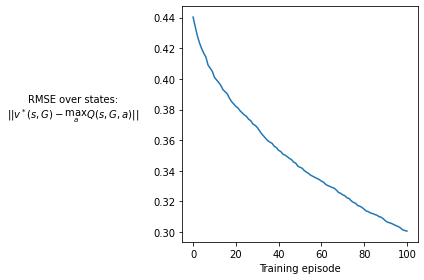

{'atomic': False, 'decay': 0.0, 'n_levels': 2}


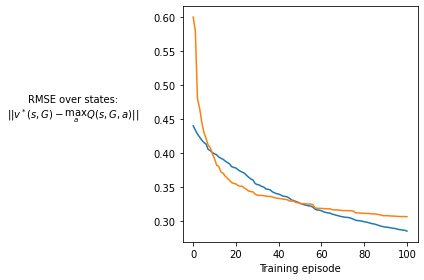

{'atomic': False, 'decay': 0.0, 'n_levels': 3}


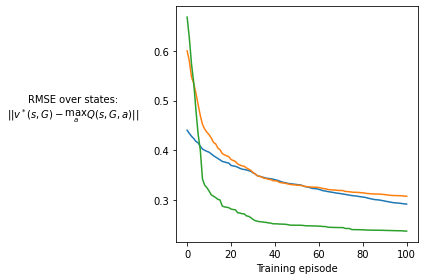

{'atomic': False, 'decay': 0.5, 'n_levels': 1}


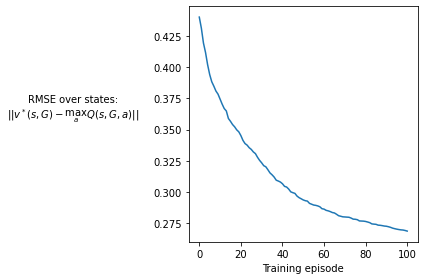

{'atomic': False, 'decay': 0.5, 'n_levels': 2}


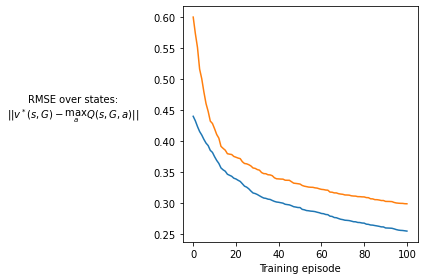

{'atomic': False, 'decay': 0.5, 'n_levels': 3}


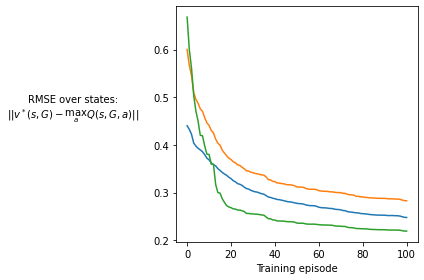

{'atomic': False, 'decay': 0.75, 'n_levels': 1}


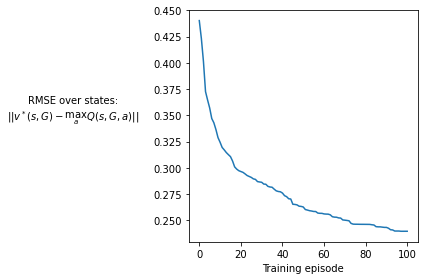

{'atomic': False, 'decay': 0.75, 'n_levels': 2}


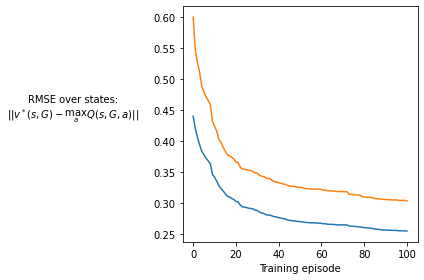

{'atomic': False, 'decay': 0.75, 'n_levels': 3}


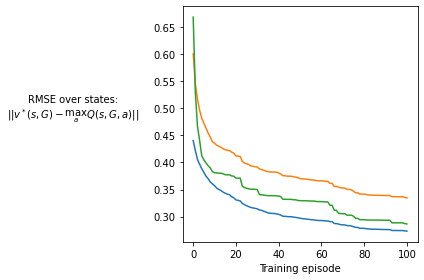

{'atomic': False, 'decay': 1.0, 'n_levels': 1}


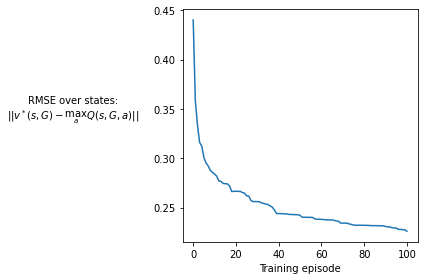

{'atomic': False, 'decay': 1.0, 'n_levels': 2}


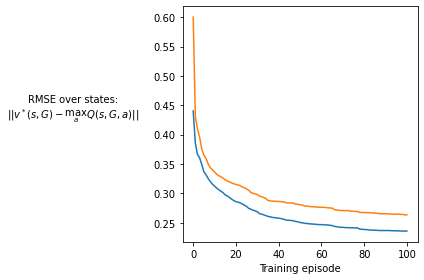

{'atomic': False, 'decay': 1.0, 'n_levels': 3}


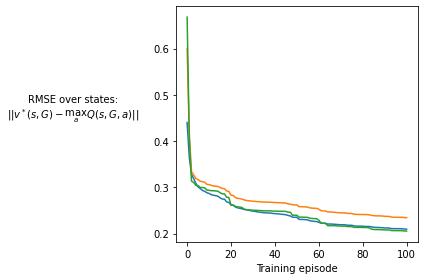

{'atomic': True, 'n_steps': 1, 'n_levels': 1}


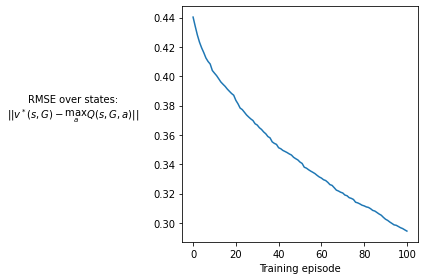

{'atomic': True, 'n_steps': 1, 'n_levels': 2}


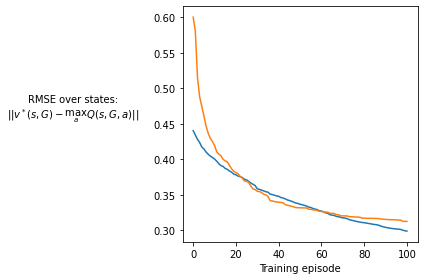

{'atomic': True, 'n_steps': 1, 'n_levels': 3}


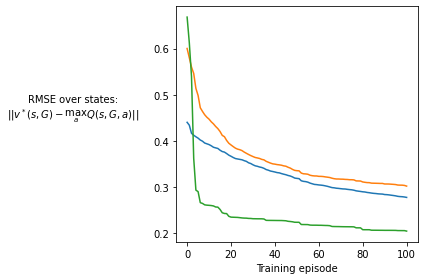

{'atomic': True, 'n_steps': 2, 'n_levels': 1}


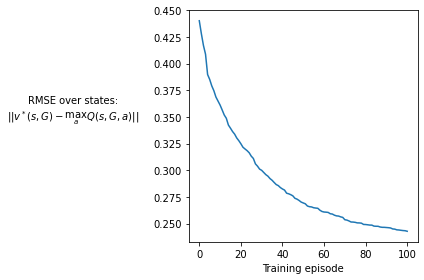

{'atomic': True, 'n_steps': 2, 'n_levels': 2}


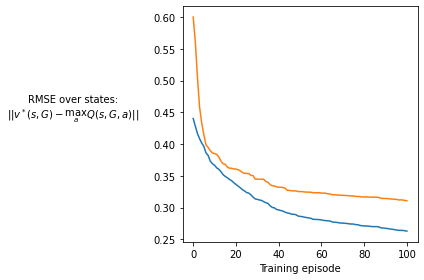

{'atomic': True, 'n_steps': 2, 'n_levels': 3}


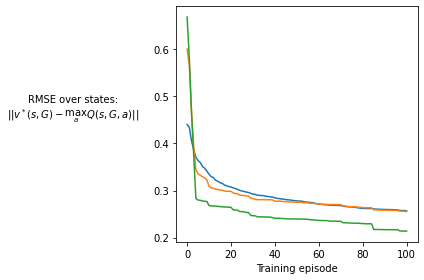

{'atomic': True, 'n_steps': 4, 'n_levels': 1}


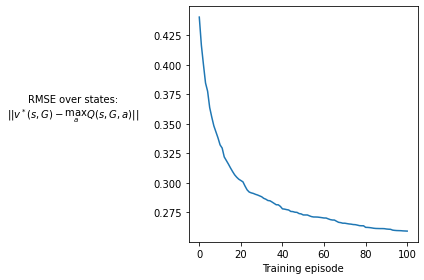

{'atomic': True, 'n_steps': 4, 'n_levels': 2}


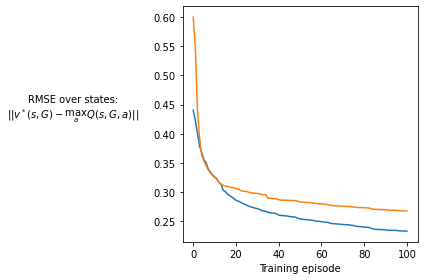

{'atomic': True, 'n_steps': 4, 'n_levels': 3}


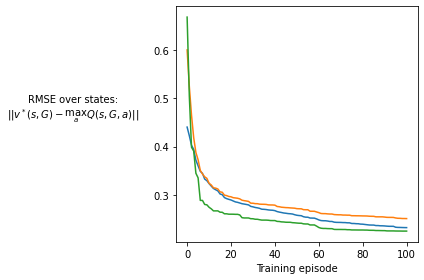

{'atomic': True, 'n_steps': 16, 'n_levels': 1}


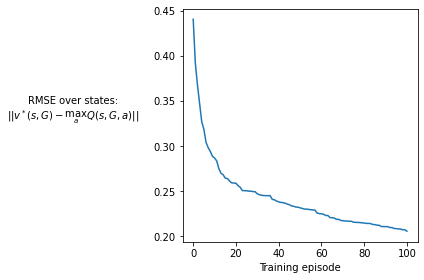

{'atomic': True, 'n_steps': 16, 'n_levels': 2}


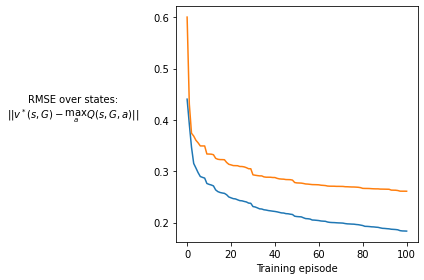

{'atomic': True, 'n_steps': 16, 'n_levels': 3}


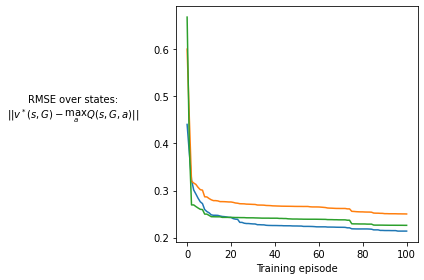

In [15]:
for env_i, env_data in enumerate(benchmark_data):    
    name, meta, data, sep = env_data.values()
    for param_i, arr in enumerate(data):
        print(meta[param_i])
        numeric, *values = list(zip(*arr[0]))
        
        for lvl in values:
            a = np.asarray(lvl)
            rmse = np.sqrt(a[:, 1])
            
            plt.plot(a[:, 2])
#             plt.plot(a[:, 1])
            
#         print(values)
        plt.ylabel("RMSE over states:\n$|| v^*(s, G) - \max_a Q(s, G, a) ||$", rotation=0, labelpad=80)
        plt.xlabel("Training episode")
        plt.tight_layout()
        plt.show()
#         print(numeric)
#         print(np.asarray(values[0]))
#         print()

{'atomic': False, 'decay': 0.0, 'n_levels': 1}


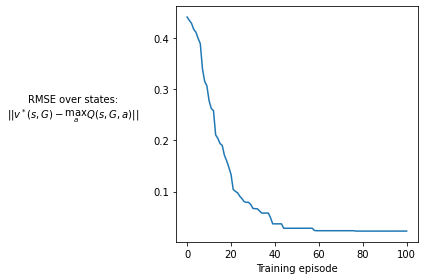

{'atomic': False, 'decay': 0.0, 'n_levels': 2}


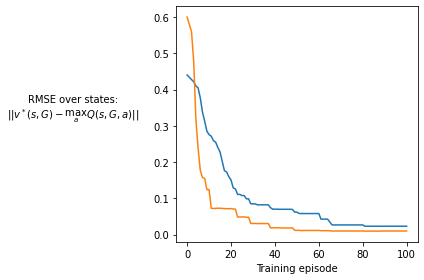

{'atomic': False, 'decay': 0.0, 'n_levels': 3}


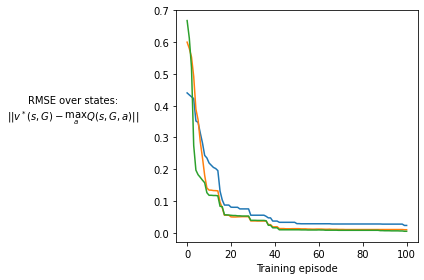

{'atomic': False, 'decay': 0.5, 'n_levels': 1}


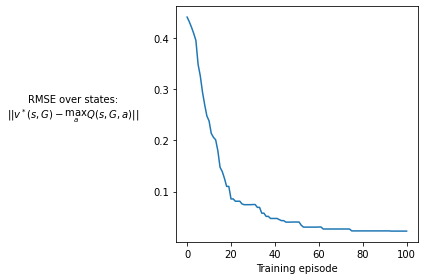

{'atomic': False, 'decay': 0.5, 'n_levels': 2}


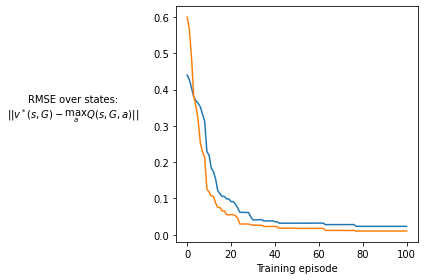

{'atomic': False, 'decay': 0.5, 'n_levels': 3}


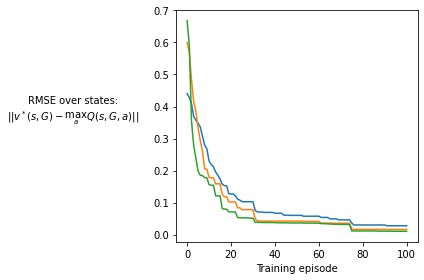

{'atomic': False, 'decay': 0.75, 'n_levels': 1}


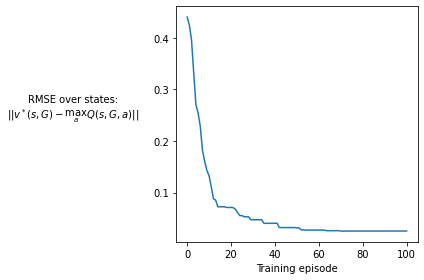

{'atomic': False, 'decay': 0.75, 'n_levels': 2}


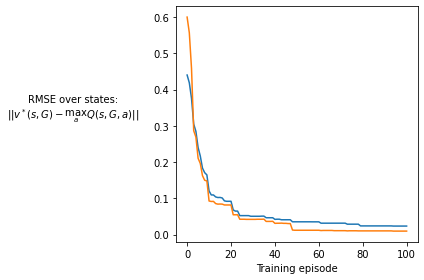

{'atomic': False, 'decay': 0.75, 'n_levels': 3}


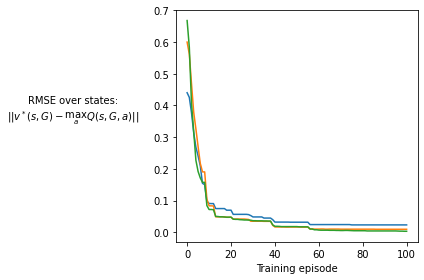

{'atomic': False, 'decay': 1.0, 'n_levels': 1}


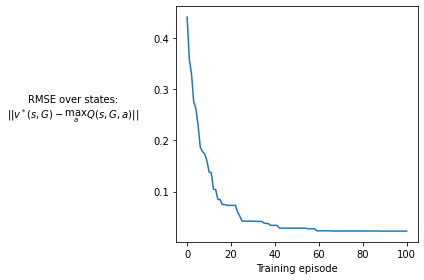

{'atomic': False, 'decay': 1.0, 'n_levels': 2}


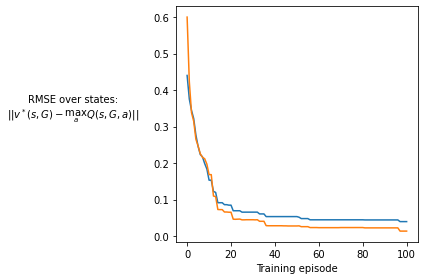

{'atomic': False, 'decay': 1.0, 'n_levels': 3}


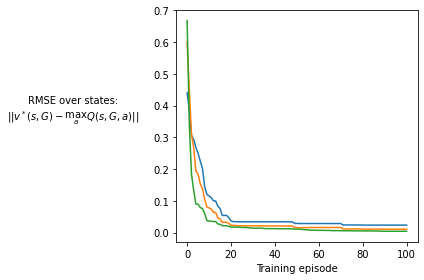

{'atomic': True, 'n_steps': 1, 'n_levels': 1}


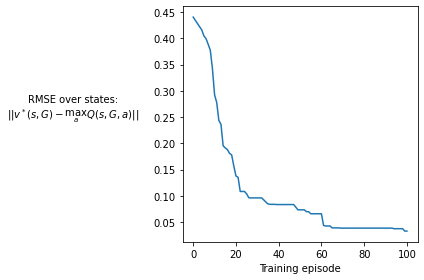

{'atomic': True, 'n_steps': 1, 'n_levels': 2}


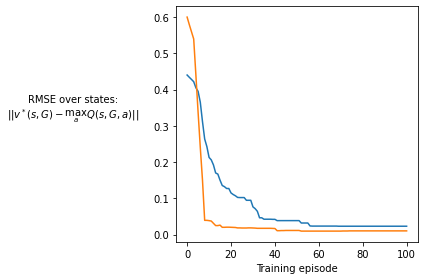

{'atomic': True, 'n_steps': 1, 'n_levels': 3}


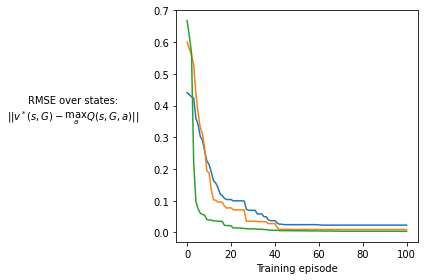

{'atomic': True, 'n_steps': 2, 'n_levels': 1}


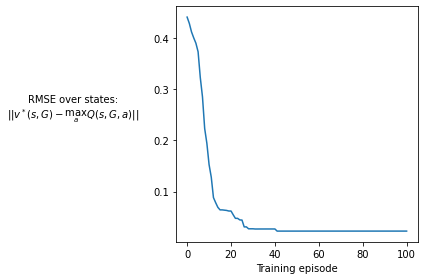

{'atomic': True, 'n_steps': 2, 'n_levels': 2}


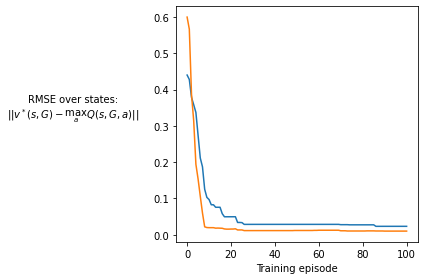

{'atomic': True, 'n_steps': 2, 'n_levels': 3}


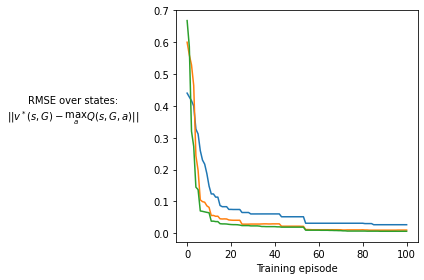

{'atomic': True, 'n_steps': 4, 'n_levels': 1}


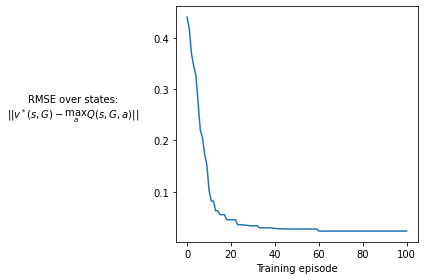

{'atomic': True, 'n_steps': 4, 'n_levels': 2}


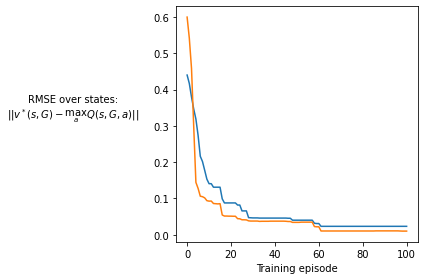

{'atomic': True, 'n_steps': 4, 'n_levels': 3}


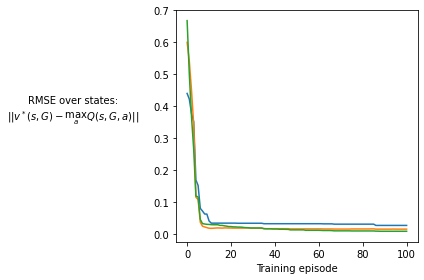

{'atomic': True, 'n_steps': 16, 'n_levels': 1}


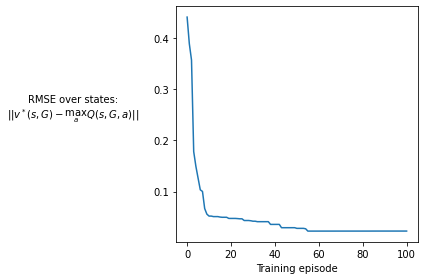

{'atomic': True, 'n_steps': 16, 'n_levels': 2}


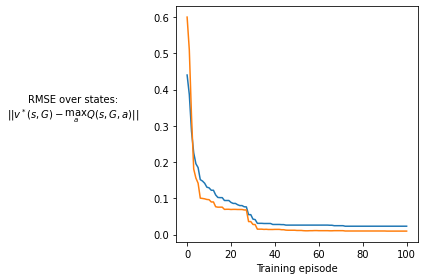

{'atomic': True, 'n_steps': 16, 'n_levels': 3}


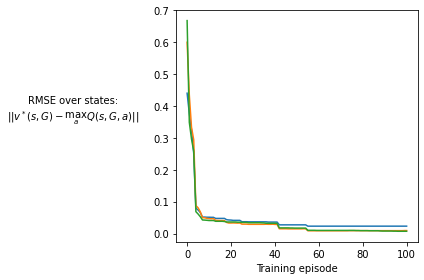

In [152]:
for env_i, env_data in enumerate(benchmark_data):    
    name, meta, data, sep = env_data.values()
    for param_i, arr in enumerate(data):
        print(meta[param_i])
        numeric, *values = list(zip(*arr[0]))
        
        for lvl in values:
            a = np.asarray(lvl)
            rmse = np.sqrt(a[:, 1])
            
            plt.plot(a[:, 2])
#             plt.plot(a[:, 1])
            
#         print(values)
        plt.ylabel("RMSE over states:\n$|| v^*(s, G) - \max_a Q(s, G, a) ||$", rotation=0, labelpad=80)
        plt.xlabel("Training episode")
        plt.tight_layout()
        plt.show()
#         print(numeric)
#         print(np.asarray(values[0]))
#         print()

# QET

# Canonical 1-step HierQ

In [300]:
_env = gym.make(name_openworld)

n_levels = 3
horizon = 3
n_steps = 5

agent = AgentShelve.retrieve(
        agent='HierQN',
        keyword_arguments=dict(
            observation_shape=_env.observation_space.shape,
            n_actions=_env.action_space.n,
            n_levels=n_levels, lr_decay=0.0,
            horizons=[horizon] * (n_levels - 1) + [200],
            hindsight_goals=True, 
            lr=1, discount=0.95, epsilon=0.25, n_steps=n_steps, shortest_path_rewards=False, decay=0.4,
            universal_top=False, relative_goals=False, relative_actions=True
        ))

goal = agent._get_index(_env.unwrapped.maze.get_end_pos()[0])
agent.set_goal(goal)

[]

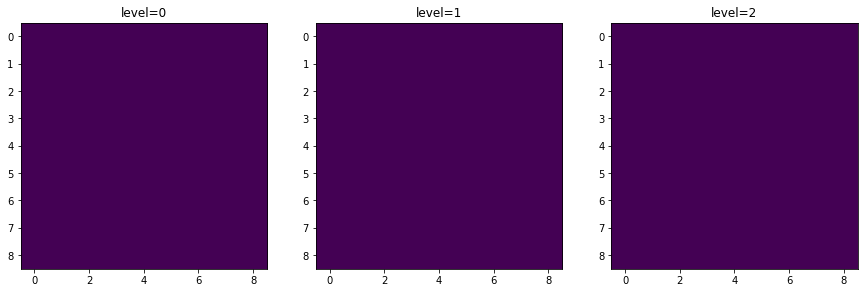

In [301]:
agent.reset()
f, ax = plt.subplots(1, n_levels, figsize=(5 * n_levels, 5))
for i, c in enumerate(agent.critics):
    g = goal if c.goal_conditioned else 0
    im = np.amax(c.table[:,g,:], axis=-1)
    
    ax[i].imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1])
    ax[i].set_title(f'level={i}')
    
plt.plot()

In [302]:
plt.imshow(agent.goal_mask[0][108].reshape((11, 11)))

AttributeError: 'HierQN' object has no attribute 'goal_mask'

In [303]:
agent.train(_env, 1000, True)

HierQ Training: 100%|██████████████████████████████████████████████████████████████| 1000/1000 [00:12<00:00, 78.59it/s]


[]

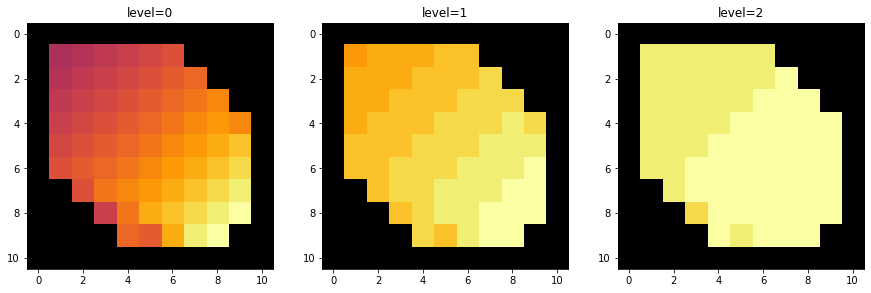

In [304]:
f, ax = plt.subplots(1, n_levels, figsize=(5 * n_levels, 5))

goal = agent._get_index(_env.unwrapped.maze.get_end_pos()[0])

for i, c in enumerate(agent.critics):
    g = goal if c.goal_conditioned else 0
    im = np.amax(c.table[:,g,:], axis=-1)
    if agent.shortest_path_rewards:
        im = -np.log(np.abs(im) + 1)
    
    ax[i].imshow(im.reshape(agent.observation_shape), cmap=plt.cm.inferno)
    ax[i].set_title(f'level={i}')
    
plt.plot()

[]

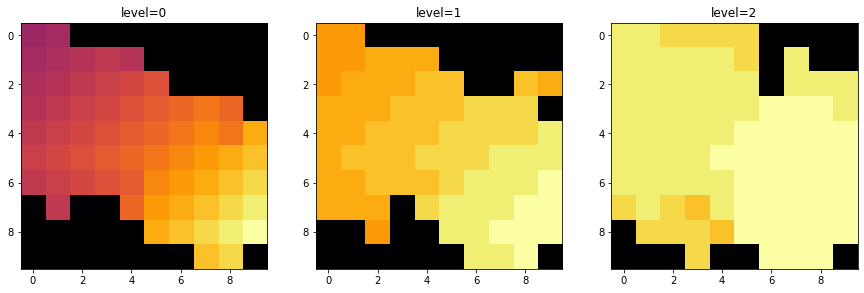

In [20]:
f, ax = plt.subplots(1, n_levels, figsize=(5 * n_levels, 5))

goal = agent._get_index(np.asarray([10, 10]))

for i, c in enumerate(agent.critics):
    g = goal if c.goal_conditioned else 0
    im = np.amax(c.table[:,g,:], axis=-1)
    
    ax[i].imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1], cmap=plt.cm.inferno)
    ax[i].set_title(f'level={i}')
    
plt.plot()

In [108]:
agent.reset()

steps = 10

images = list()
traces = list()
for _ in range(steps):
    agent.train(_env, 1, True)
    traces.append(deepcopy(agent.trace))  # Control-trace
    
    # Trace images.
    it_images = list()
    
    # Trace
    im = np.zeros(agent.observation_shape)
    trace = [np.unravel_index(s.state, agent.observation_shape) for s in agent.trace.raw]
    for t, (r, c) in enumerate(trace):
        im[r, c] = t
    it_images.append(im[1:-1,1:-1])
    
    # Backup
    for i, c in enumerate(agent.critics):
        g = goal if c.goal_conditioned else 0
        im = np.amax(c.table[:,g,:], axis=-1)
        it_images.append(im.reshape(agent.observation_shape)[1:-1, 1:-1])
    
    images.append(it_images)
    

HierQ Training: 100%|████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 66.67it/s]


[]

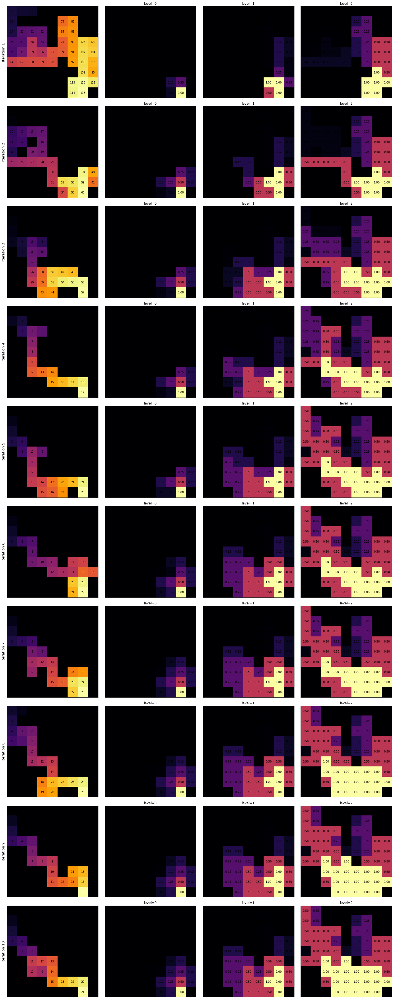

In [109]:
f, ax = plt.subplots(steps, n_levels + 1, figsize=(5*(n_levels + 1), 5*steps))
for y, ims in enumerate(images):
    
    for i, c in enumerate(ims):
        ax[y, i].imshow(c, cmap=plt.cm.inferno)
        
        rows, columns = np.meshgrid(np.arange(len(c)), np.arange(len(c)))
        for v, row, col in zip(c.ravel(), rows.flatten(), columns.flatten()):
            if i == 0:
                ax[y, i].text(row, col, f'{int(v)}', va='center', ha='center')
            else:
                ax[y, i].text(row, col, f'{v:.2f}', va='center', ha='center')
        
        if i != 0:
            ax[y, i].set_title(f'level={i-1}')
        
        ax[y, i].set_xticks([])
        ax[y, i].set_yticks([])
        
        if i == 0:
            ax[y, i].set_ylabel(f'Iteration {y+1}', fontsize=13)

plt.tight_layout()
plt.plot()

[]

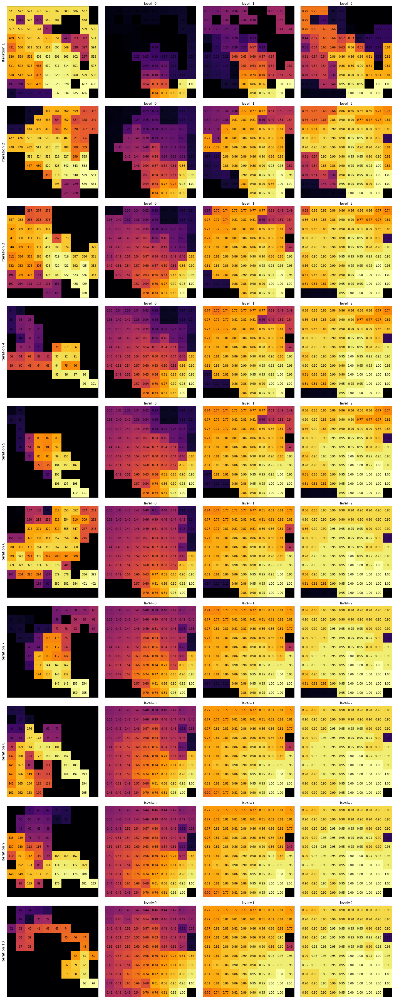

In [18]:
f, ax = plt.subplots(steps, n_levels + 1, figsize=(5*(n_levels + 1), 5*steps))
for y, ims in enumerate(images):
    
    for i, c in enumerate(ims):
        ax[y, i].imshow(c, cmap=plt.cm.inferno)
        
        rows, columns = np.meshgrid(np.arange(len(c)), np.arange(len(c)))
        for v, row, col in zip(c.ravel(), rows.flatten(), columns.flatten()):
            if i == 0:
                ax[y, i].text(row, col, f'{int(v)}', va='center', ha='center')
            else:
                ax[y, i].text(row, col, f'{v:.2f}', va='center', ha='center')
        
        if i != 0:
            ax[y, i].set_title(f'level={i-1}')
        
        ax[y, i].set_xticks([])
        ax[y, i].set_yticks([])
        
        if i == 0:
            ax[y, i].set_ylabel(f'Iteration {y+1}', fontsize=13)

plt.tight_layout()
plt.plot()

# N-step Atomic

In [25]:
_env = gym.make(name_gridworld)

agent = AgentShelve.retrieve(
    agent='TabularQLearnerN',
    keyword_arguments=dict(
        observation_shape = _env.observation_space.shape,
        n_actions = _env.action_space.n,
        lr=1, epsilon=0.25,
        n_steps=3
    )
)



[]

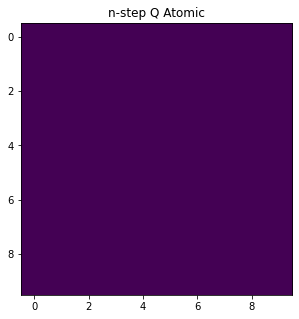

In [26]:
agent.reset()

f, ax = plt.subplots(1, 1, figsize=(5, 5))

im = np.amax(agent._q_table, axis=-1)
    
ax.imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1])
ax.set_title(f'n-step Q Atomic')
    
plt.plot()

In [27]:
agent.train(_env, 100, True)

TabularQLearning Training: 100%|█████████████████████████████████████████████████████| 100/100 [00:01<00:00, 70.27it/s]


[]

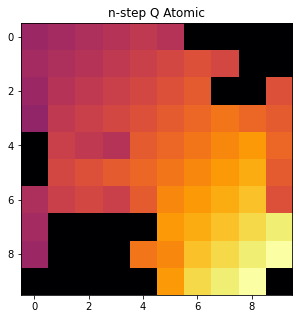

In [28]:
f, ax = plt.subplots(1, 1, figsize=(5, 5))

im = np.amax(agent._q_table, axis=-1)
    
ax.imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1], cmap=plt.cm.inferno)
ax.set_title(f'n-step Q Atomic')
    
plt.plot()

In [29]:
agent.reset()

steps = 10

images = list()
traces = list()
for _ in range(steps):
    agent.train(_env, 1, True)
    traces.append(deepcopy(agent.transitions))  # Control-trace
    
    # Trace images.
    it_images = list()
    
    # Trace
    im = np.zeros(agent.observation_shape)
    trace = [agent._get_pos(s.state) for s in agent.transitions]
    for t, (r, c) in enumerate(trace):
        im[r, c] = t
    it_images.append(im[1:-1,1:-1])
    
    # Backup
    im = np.amax(agent._q_table, axis=-1)
    it_images.append(im.reshape(agent.observation_shape)[1:-1, 1:-1])
    
    images.append(it_images)
    

TabularQLearning Training: 100%|█████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 99.94it/s]


[]

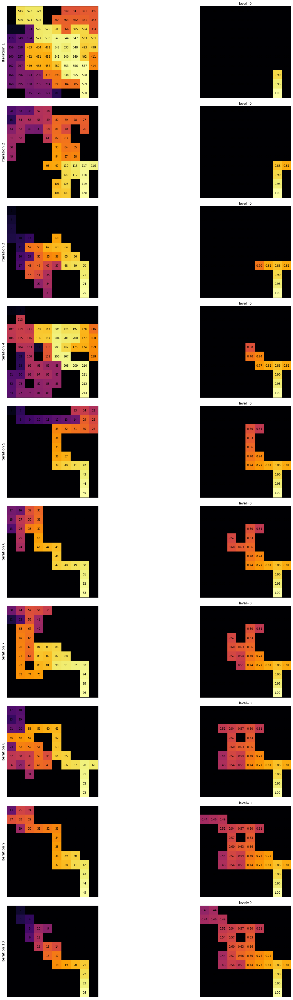

In [30]:
f, ax = plt.subplots(steps, 2, figsize=(25, 50))
for y, ims in enumerate(images):
    
    for i, c in enumerate(ims):
        ax[y, i].imshow(c, cmap=plt.cm.inferno)
        
        rows, columns = np.meshgrid(np.arange(len(c)), np.arange(len(c)))
        for v, row, col in zip(c.ravel(), rows.flatten(), columns.flatten()):
            if i == 1:
                ax[y, i].text(row, col, f'{v:.2f}', va='center', ha='center')
            else:
                ax[y, i].text(row, col, f'{int(v)}', va='center', ha='center')
        
        if i != 0:
            ax[y, i].set_title(f'level={i-1}')
        
        ax[y, i].set_xticks([])
        ax[y, i].set_yticks([])
        
        if i == 0:
            ax[y, i].set_ylabel(f'Iteration {y+1}', fontsize=13)

plt.tight_layout()
plt.plot()

# N-step HierQ

In [256]:
_env = gym.make(name_gridworld)

n_levels = 2
horizon = 3
n_steps = 16

agent = AgentShelve.retrieve(
        agent='HierQN',
        keyword_arguments=dict(
            observation_shape=_env.observation_space.shape,
            n_actions=_env.action_space.n,
            n_levels=n_levels,
            horizons=[horizon] * (n_levels - 1) + [3],
            lr=1, discount=1, epsilon=0.25, n_steps=n_steps,shortest_path_rewards=True,
            universal_top=False, relative_actions=True
        ))

goal = agent._get_index(_env.unwrapped.maze.get_end_pos()[0])
agent.set_goal(goal)

[]

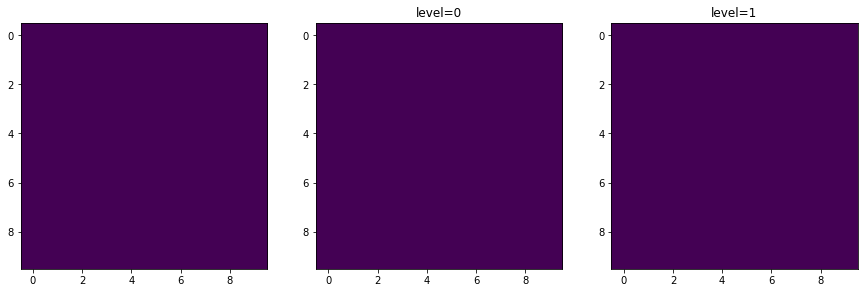

In [257]:
agent.reset()
f, ax = plt.subplots(1, 1+n_levels, figsize=(5 * (1 + n_levels), 5))
ax[0].imshow(np.zeros(agent.observation_shape)[1:-1,1:-1])
for i, c in enumerate(agent.critics):
    g = goal if c.goal_conditioned else 0
    im = np.amax(c.table[:,g,:], axis=-1)
    
    ax[i+1].imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1])
    ax[i+1].set_title(f'level={i}')
    
plt.plot()

In [235]:
agent.train(_env, 100, True)

HierQ Training: 100%|████████████████████████████████████████████████████████████████| 100/100 [00:01<00:00, 51.33it/s]


[]

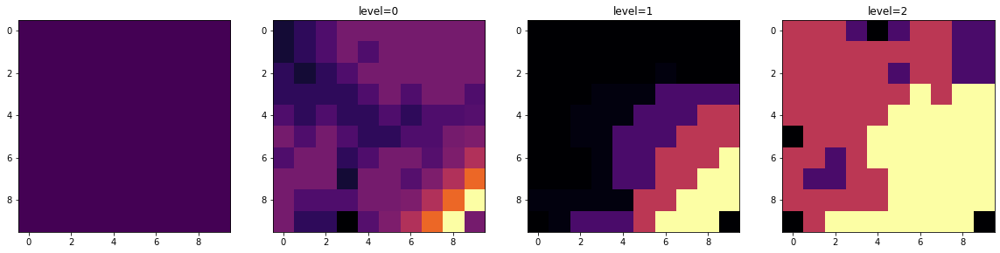

In [237]:
f, ax = plt.subplots(1, n_levels+1, figsize=(5 * (1 + n_levels), 5))

goal = agent._get_index(_env.unwrapped.maze.get_end_pos()[0])

ax[0].imshow(np.zeros(agent.observation_shape)[1:-1,1:-1])
for i, c in enumerate(agent.critics):
    g = goal if c.goal_conditioned else 0
    im = np.amax(c.table[:,g,:], axis=-1)
    
    if agent.shortest_path_rewards:
        im = -np.log(np.abs(im) + 1)
    
    ax[i+1].imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1], cmap=plt.cm.inferno)
    ax[i+1].set_title(f'level={i}')
    
plt.plot()

In [258]:
agent.reset()

steps = 10

images = list()
traces = list()
for _ in range(steps):
    agent.train(_env, 1, True)
    traces.append(deepcopy(agent.trace))  # Control-trace
    
    # Trace images.
    it_images = list()
    
    # Trace
    im = np.zeros(agent.observation_shape)
    trace = [np.unravel_index(s.state, agent.observation_shape) for s in agent.trace.raw]
    for t, (r, c) in enumerate(trace):
        im[r, c] = t
    it_images.append(im[1:-1,1:-1])
    
    # Backup
    for i, c in enumerate(agent.critics):
        g = goal if c.goal_conditioned else 0
        im = np.amax(c.table[:,g,:], axis=-1)
        it_images.append(im.reshape(agent.observation_shape)[1:-1, 1:-1])
    
    images.append(it_images)
    

HierQ Training: 100%|████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 41.67it/s]


[]

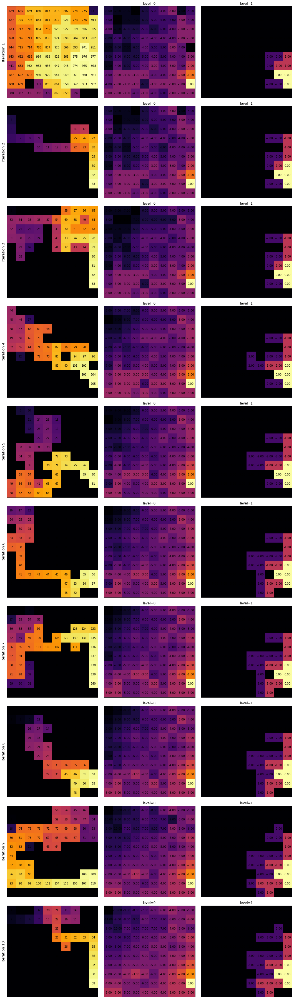

In [259]:
f, ax = plt.subplots(steps, n_levels + 1, figsize=(5*(n_levels + 1), 5*steps))
for y, ims in enumerate(images):
    
    for i, c in enumerate(ims):
        if i > 0 and agent.shortest_path_rewards:
            ax[y, i].imshow(-np.log(np.abs(c) + 1), cmap=plt.cm.inferno)
        else:
            ax[y, i].imshow(c, cmap=plt.cm.inferno)
        
        rows, columns = np.meshgrid(np.arange(len(c)), np.arange(len(c)))
        for v, row, col in zip(c.ravel(), rows.flatten(), columns.flatten()):
            if i == 0:
                ax[y, i].text(row, col, f'{int(v)}', va='center', ha='center')
            else:
                ax[y, i].text(row, col, f'{v:.2f}', va='center', ha='center')
        
        if i != 0:
            ax[y, i].set_title(f'level={i-1}')
        
        ax[y, i].set_xticks([])
        ax[y, i].set_yticks([])
        
        if i == 0:
            ax[y, i].set_ylabel(f'Iteration {y+1}', fontsize=13)

plt.tight_layout()
plt.plot()

# Q($\lambda$)

In [35]:
_env = gym.make(name_gridworld)

decay = 1.0

agent = AgentShelve.retrieve(
        agent='TabularQLambda', 
        keyword_arguments=dict(
            observation_shape = _env.observation_space.shape,
            n_actions = _env.action_space.n,
            decay=decay, lr=1.0, epsilon=0.25, discount=0.95,
            replace=True, decay_lr=0.0, sarsa=True,
        )
    )

[]

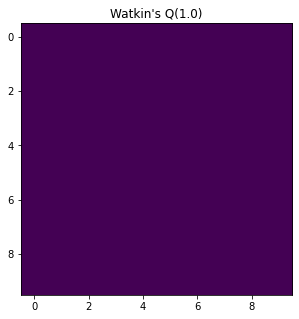

In [36]:
agent.reset()
f, ax = plt.subplots(1, 1, figsize=(5 * 1, 5))

im = np.amax(agent._q_table, axis=-1)
    
ax.imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1])
ax.set_title(f'Watkin\'s Q({decay})')
    
plt.plot()

In [567]:
%lprun -f agent.train agent.train(_env, 100, True)

TabularQLearning Training: 100%|█████████████████████████████████████████████████████| 100/100 [00:02<00:00, 36.15it/s]


Timer unit: 1e-07 s

Total time: 2.70404 s
File: C:\Users\joery\PycharmProjects\Hieararchical-Muzero\notebooks\Tabular\mazelab_experimenter\agents\baseline.py
Function: train at line 285

Line #      Hits         Time  Per Hit   % Time  Line Contents
   285                                               def train(self, _env: gym.Env, num_episodes: int, progress_bar: bool = False) -> None:
   286                                                   iterator = (tqdm.trange(num_episodes, file=sys.stdout, desc="TabularQLearning Training")
   287         1      18046.0  18046.0      0.1                      if progress_bar else range(num_episodes))
   288                                           
   289       101     153554.0   1520.3      0.6          for _ in iterator:
   290                                                       # Reinitialize environment after each episode.
   291       100      45986.0    459.9      0.2              state, goal_achieved, done = _env.reset(), False, False
 

In [37]:
agent.train(_env, 100, True)

TabularQLearning Training: 100%|█████████████████████████████████████████████████████| 100/100 [00:03<00:00, 32.19it/s]


[]

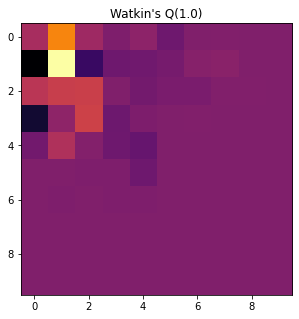

In [38]:
f, ax = plt.subplots(1, 1, figsize=(5 * 1, 5))

im = np.amax(agent._q_table, axis=-1)
    
ax.imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1], cmap=plt.cm.inferno)
ax.set_title(f'Watkin\'s Q({decay})')
    
plt.plot()

In [40]:
im.max()

7.2569837e+25

In [41]:
agent.reset()

steps = 10

images = list()
traces = list()
for _ in range(steps):
    agent.train(_env, 1, True)
    traces.append(deepcopy(agent.transitions))  # Control-trace
    
    # Trace images.
    it_images = list()
    
    # Trace
    im = np.zeros(agent.observation_shape)
    
    trace = [agent._get_pos(t.state) for t in agent.transitions]
    for t, (r, c) in enumerate(trace):
        im[r, c] = t
    it_images.append(im[1:-1,1:-1])
    
    # Backup
    im = np.amax(agent._q_table, axis=-1)
    it_images.append(im.reshape(agent.observation_shape)[1:-1, 1:-1])
    
    images.append(it_images)
    

TabularQLearning Training: 100%|████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 142.92it/s]


[]

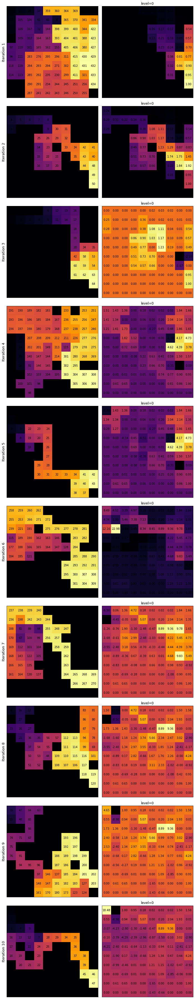

In [42]:
f, ax = plt.subplots(steps, 1 + 1, figsize=(5*(1 + 1), 5*steps))
for y, ims in enumerate(images):
    
    for i, c in enumerate(ims):
        ax[y, i].imshow(c, cmap=plt.cm.inferno)
        
        rows, columns = np.meshgrid(np.arange(len(c)), np.arange(len(c)))
        for v, row, col in zip(c.ravel(), rows.flatten(), columns.flatten()):
            if i == 0:
                ax[y, i].text(row, col, f'{int(v)}', va='center', ha='center')
            else:
                ax[y, i].text(row, col, f'{v:.2f}', va='center', ha='center')
        
        if i != 0:
            ax[y, i].set_title(f'level={i-1}')
        
        ax[y, i].set_xticks([])
        ax[y, i].set_yticks([])
        
        if i == 0:
            ax[y, i].set_ylabel(f'Iteration {y+1}', fontsize=13)

plt.tight_layout()
plt.plot()

# HierQ($\lambda$)

In [122]:
_env = gym.make(name_gridworld)

n_levels = 2
horizon = 3
decay = 0.4

agent = AgentShelve.retrieve(
        agent='HierQLambda',
        keyword_arguments=dict(
            observation_shape=_env.observation_space.shape,
            n_actions=_env.action_space.n,
            n_levels=n_levels,
            horizons=[horizon] * (n_levels - 1) + [200],
            lr=0.5, discount=0.95, epsilon=[0.25, 0.1], decay=decay, shortest_path_rewards=False, sarsa=True, lr_decay=-0.5,
            universal_top=False, relative_actions=True
        ))

goal = agent._get_index(_env.unwrapped.maze.get_end_pos()[0])
agent.set_goal(goal)

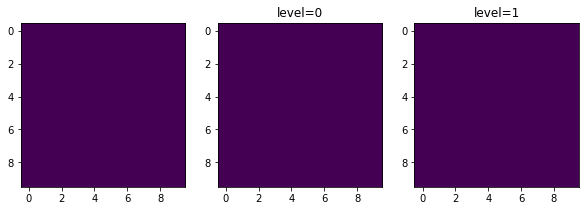

In [123]:
agent.reset()
f, ax = plt.subplots(1, 1+n_levels, figsize=(5 * n_levels, 5))
ax[0].imshow(np.zeros(agent.observation_shape)[1:-1,1:-1])
for i, c in enumerate(agent.critics):
    g = goal if c.goal_conditioned else 0
    im = np.amax(c.table[:,g,:], axis=-1)
    
    ax[i+1].imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1])
    ax[i+1].set_title(f'level={i}')
    
plt.show()

In [124]:
agent.train(_env, 10, True)

HierQ Training: 100%|██████████████████████████████████████████████████████████████████| 10/10 [00:01<00:00,  5.52it/s]


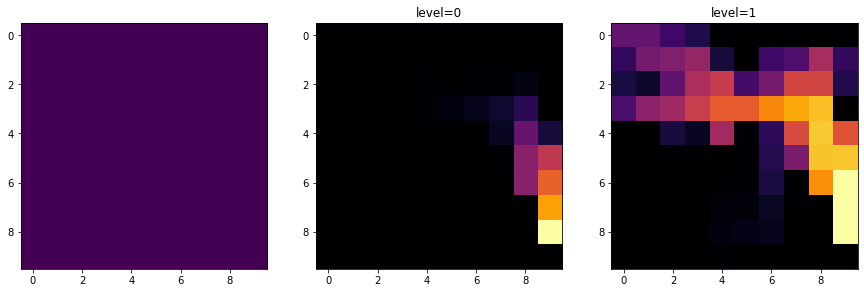

In [125]:
f, ax = plt.subplots(1, 1+n_levels, figsize=(5 * (n_levels+1), 5))

goal = agent._get_index(_env.unwrapped.maze.get_end_pos()[0])

ax[0].imshow(np.zeros(agent.observation_shape)[1:-1,1:-1])
for i, c in enumerate(agent.critics):
    g = goal if c.goal_conditioned else 0
    im = np.amax(c.table[:,g,:], axis=-1)
    ax[i+1].imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1], cmap=plt.cm.inferno)
    ax[i+1].set_title(f'level={i}')
    
plt.show()

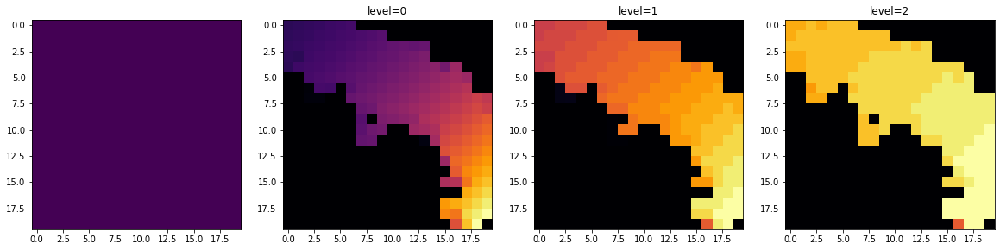

In [277]:
f, ax = plt.subplots(1, 1+n_levels, figsize=(5 * (n_levels+1), 5))

goal = agent._get_index(_env.unwrapped.maze.get_end_pos()[0])

ax[0].imshow(np.zeros(agent.observation_shape)[1:-1,1:-1])
for i, c in enumerate(agent.critics):
    g = goal if c.goal_conditioned else 0
    im = np.amax(c.table[:,g,:], axis=-1)
    ax[i+1].imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1], cmap=plt.cm.inferno)
    ax[i+1].set_title(f'level={i}')
    
plt.show()

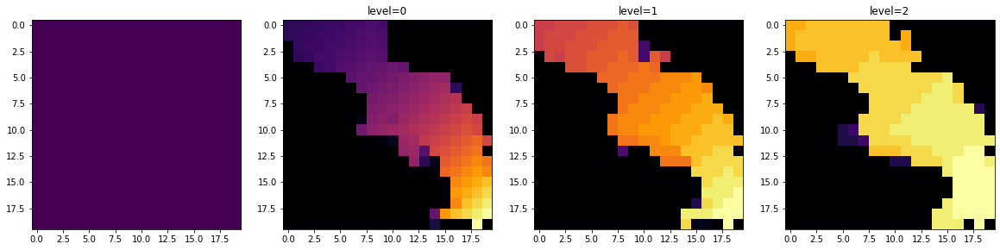

In [18]:
f, ax = plt.subplots(1, 1+n_levels, figsize=(5 * (n_levels+1), 5))

goal = agent._get_index(_env.unwrapped.maze.get_end_pos()[0])

ax[0].imshow(np.zeros(agent.observation_shape)[1:-1,1:-1])
for i, c in enumerate(agent.critics):
    g = goal if c.goal_conditioned else 0
    im = np.amax(c.table[:,g,:], axis=-1)
    ax[i+1].imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1], cmap=plt.cm.inferno)
    ax[i+1].set_title(f'level={i}')
    
plt.show()

[]

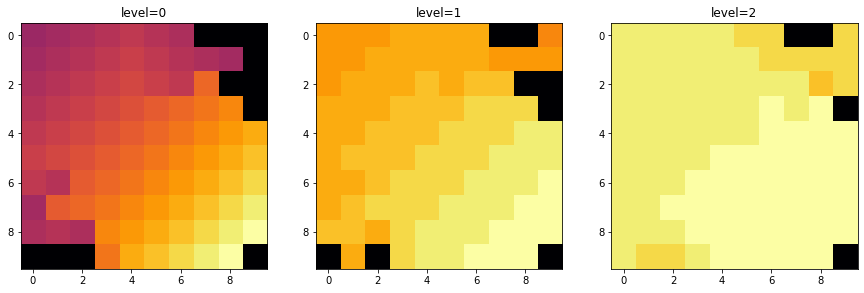

In [47]:
f, ax = plt.subplots(1, n_levels, figsize=(5 * n_levels, 5))

goal = agent._get_index(np.asarray([10, 10]))

for i, c in enumerate(agent.critics):
    g = goal if c.goal_conditioned else 0
    im = np.amax(c.table[:,g,:], axis=-1)
    
    ax[i].imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1], cmap=plt.cm.inferno)
    ax[i].set_title(f'level={i}')
    
plt.plot()

In [50]:
x = np.arange(5)

x = np.delete(x, 2)
np.delete(x, 2)


array([0, 1, 4])

[]

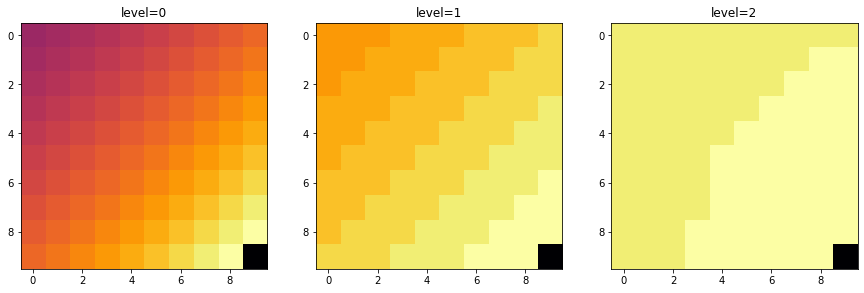

In [364]:
f, ax = plt.subplots(1, n_levels, figsize=(5 * n_levels, 5))

goal = agent._get_index(np.asarray([10, 10]))

for i, c in enumerate(agent.critics):
    g = goal if c.goal_conditioned else 0
    im = np.amax(c.table[:,g,:], axis=-1)
    
    ax[i].imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1], cmap=plt.cm.inferno)
    ax[i].set_title(f'level={i}')
    
plt.plot()

[]

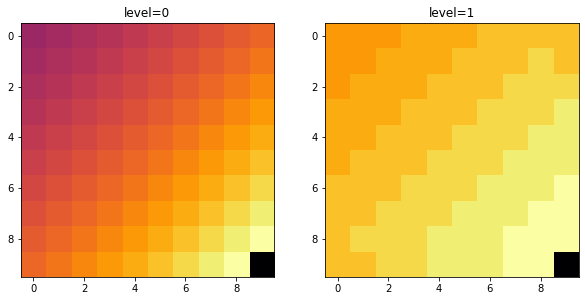

In [355]:
f, ax = plt.subplots(1, n_levels, figsize=(5 * n_levels, 5))

goal = agent._get_index(np.asarray([10, 10]))

for i, c in enumerate(agent.critics):
    g = goal if c.goal_conditioned else 0
    im = np.amax(c.table[:,g,:], axis=-1)
    
    ax[i].imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1], cmap=plt.cm.inferno)
    ax[i].set_title(f'level={i}')
    
plt.plot()

[]

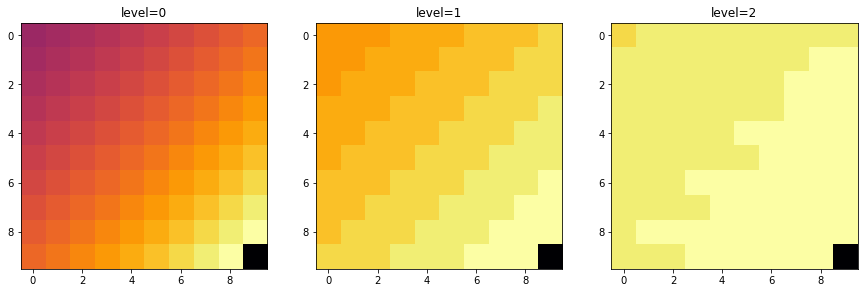

In [360]:
f, ax = plt.subplots(1, n_levels, figsize=(5 * n_levels, 5))

goal = agent._get_index(np.asarray([10, 10]))

for i, c in enumerate(agent.critics):
    g = goal if c.goal_conditioned else 0
    im = np.amax(c.table[:,g,:], axis=-1)
    
    ax[i].imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1], cmap=plt.cm.inferno)
    ax[i].set_title(f'level={i}')
    
plt.plot()

[]

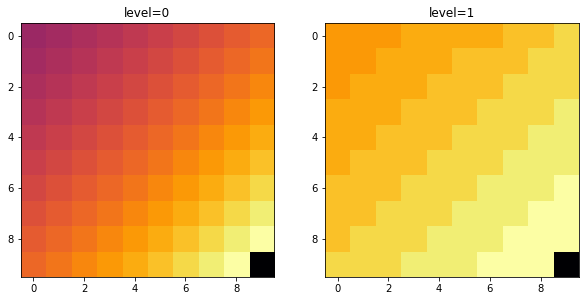

In [351]:
f, ax = plt.subplots(1, n_levels, figsize=(5 * n_levels, 5))

goal = agent._get_index(np.asarray([10, 10]))

for i, c in enumerate(agent.critics):
    g = goal if c.goal_conditioned else 0
    im = np.amax(c.table[:,g,:], axis=-1)
    
    ax[i].imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1], cmap=plt.cm.inferno)
    ax[i].set_title(f'level={i}')
    
plt.plot()

[]

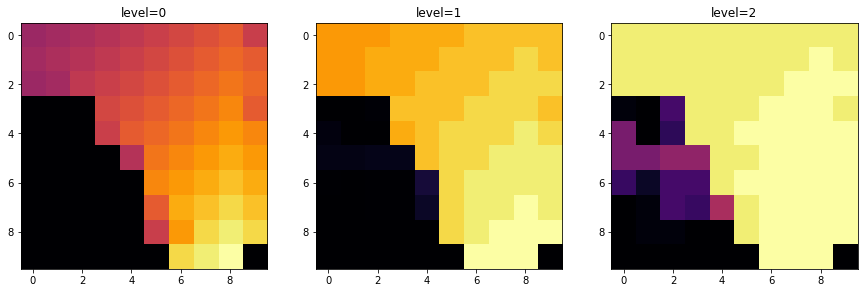

In [235]:
f, ax = plt.subplots(1, n_levels, figsize=(5 * n_levels, 5))

goal = agent._get_index(np.asarray([10, 10]))

for i, c in enumerate(agent.critics):
    g = goal if c.goal_conditioned else 0
    im = np.amax(c.table[:,g,:], axis=-1)
    
    ax[i].imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1], cmap=plt.cm.inferno)
    ax[i].set_title(f'level={i}')
    
plt.plot()

[]

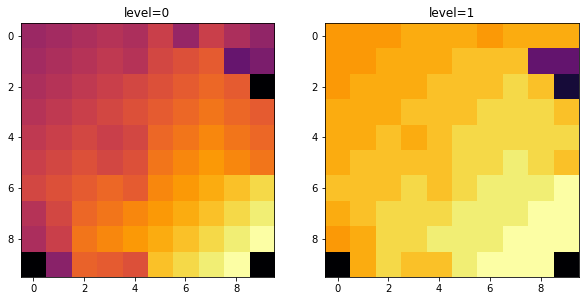

In [328]:
f, ax = plt.subplots(1, n_levels, figsize=(5 * n_levels, 5))

goal = agent._get_index(np.asarray([10, 10]))

for i, c in enumerate(agent.critics):
    g = goal if c.goal_conditioned else 0
    im = np.amax(c.table[:,g,:], axis=-1)
    
    ax[i].imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1], cmap=plt.cm.inferno)
    ax[i].set_title(f'level={i}')
    
plt.plot()

[]

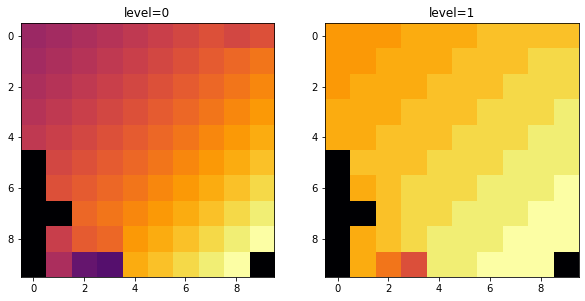

In [772]:
f, ax = plt.subplots(1, n_levels, figsize=(5 * n_levels, 5))

goal = agent._get_index(np.asarray([10, 10]))

for i, c in enumerate(agent.critics):
    g = goal if c.goal_conditioned else 0
    im = np.amax(c.table[:,g,:], axis=-1)
    
    ax[i].imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1], cmap=plt.cm.inferno)
    ax[i].set_title(f'level={i}')
    
plt.plot()

[]

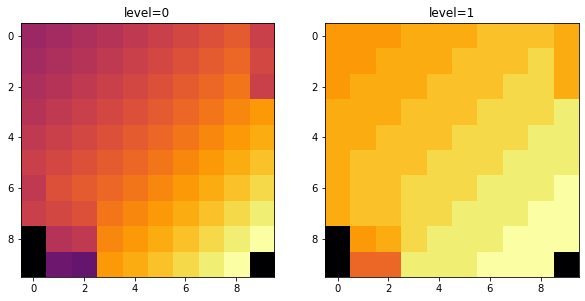

In [666]:
f, ax = plt.subplots(1, n_levels, figsize=(5 * n_levels, 5))

goal = agent._get_index(np.asarray([10, 10]))

for i, c in enumerate(agent.critics):
    g = goal if c.goal_conditioned else 0
    im = np.amax(c.table[:,g,:], axis=-1)
    
    ax[i].imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1], cmap=plt.cm.inferno)
    ax[i].set_title(f'level={i}')
    
plt.plot()

[]

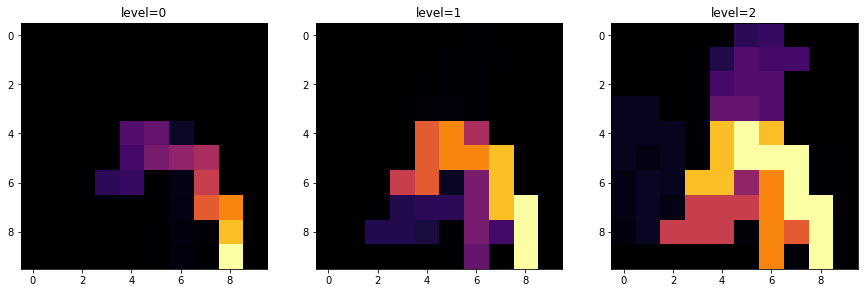

In [575]:
f, ax = plt.subplots(1, n_levels, figsize=(5 * n_levels, 5))

goal = agent._get_index(np.asarray([10, 10]))

for i, c in enumerate(agent.critics):
    g = goal if c.goal_conditioned else 0
    im = np.amax(c.table[:,g,:], axis=-1)
    
    ax[i].imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1], cmap=plt.cm.inferno)
    ax[i].set_title(f'level={i}')
    
plt.plot()

[]

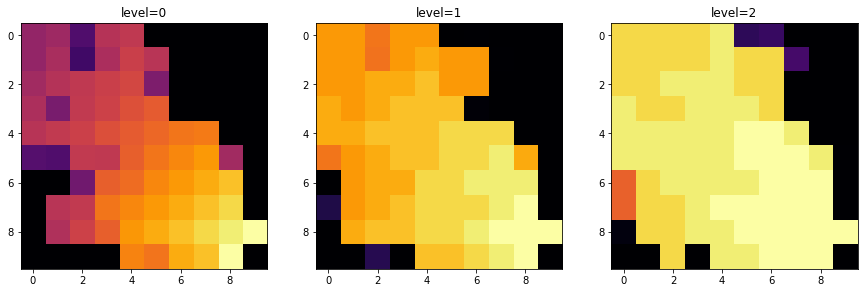

In [578]:
f, ax = plt.subplots(1, n_levels, figsize=(5 * n_levels, 5))

goal = agent._get_index(np.asarray([10, 10]))

for i, c in enumerate(agent.critics):
    g = goal if c.goal_conditioned else 0
    im = np.amax(c.table[:,g,:], axis=-1)
    
    ax[i].imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1], cmap=plt.cm.inferno)
    ax[i].set_title(f'level={i}')
    
plt.plot()

[]

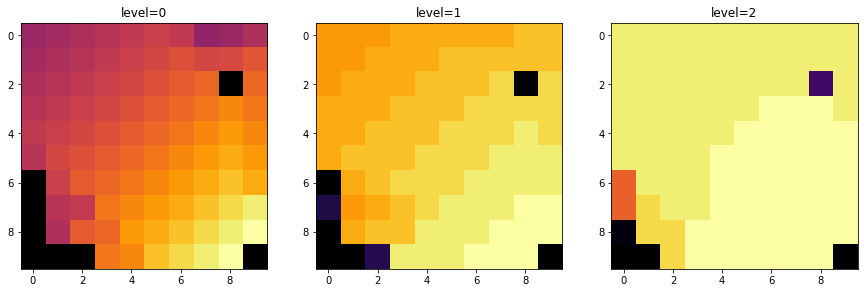

In [580]:
f, ax = plt.subplots(1, n_levels, figsize=(5 * n_levels, 5))

goal = agent._get_index(np.asarray([10, 10]))

for i, c in enumerate(agent.critics):
    g = goal if c.goal_conditioned else 0
    im = np.amax(c.table[:,g,:], axis=-1)
    
    ax[i].imshow(im.reshape(agent.observation_shape)[1:-1, 1:-1], cmap=plt.cm.inferno)
    ax[i].set_title(f'level={i}')
    
plt.plot()

In [128]:
agent.reset()

steps = 10

images = list()
traces = list()
for _ in range(steps):
    agent.train(_env, 1, True)
    traces.append(deepcopy(agent.trace))  # Control-trace
    
    # Trace images.
    it_images = list()
    
    # Trace
    im = np.zeros(agent.observation_shape)
    trace = [np.unravel_index(s.state, agent.observation_shape) for s in agent.trace.raw]
    for t, (r, c) in enumerate(trace):
        im[r, c] = t
    it_images.append(im[1:-1,1:-1])
    
    # Backup
    for i, c in enumerate(agent.critics):
        g = goal if c.goal_conditioned else 0
        im = np.amax(c.table[:,g,:], axis=-1)
        it_images.append(im.reshape(agent.observation_shape)[1:-1, 1:-1])
    
    images.append(it_images)
    

HierQ Training: 100%|████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  9.71it/s]


array([0.25, 0.  , 0.  ], dtype=float32)

[]

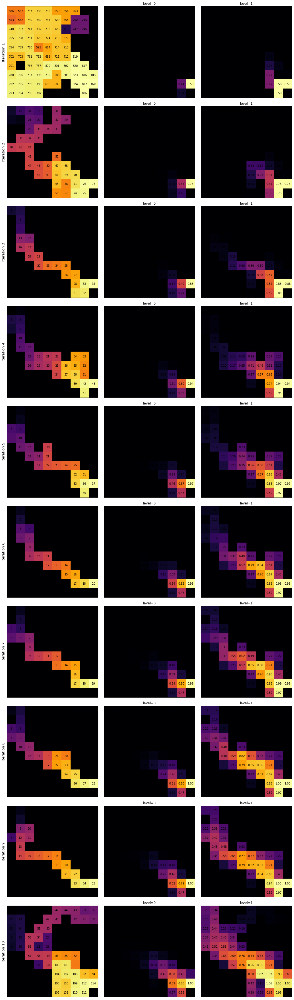

In [129]:
f, ax = plt.subplots(steps, n_levels + 1, figsize=(5*(n_levels + 1), 5*steps))
for y, ims in enumerate(images):
    
    for i, c in enumerate(ims):
        if i > 0 and agent.shortest_path_rewards:
            ax[y, i].imshow(-np.log(np.abs(c) + 1), cmap=plt.cm.inferno)
        else:
            ax[y, i].imshow(c, cmap=plt.cm.inferno)
        
        rows, columns = np.meshgrid(np.arange(len(c)), np.arange(len(c)))
        for v, row, col in zip(c.ravel(), rows.flatten(), columns.flatten()):
            if i == 0:
                ax[y, i].text(row, col, f'{int(v)}', va='center', ha='center')
            else:
                ax[y, i].text(row, col, f'{v:.2f}', va='center', ha='center')
        
        if i != 0:
            ax[y, i].set_title(f'level={i-1}')
        
        ax[y, i].set_xticks([])
        ax[y, i].set_yticks([])
        
        if i == 0:
            ax[y, i].set_ylabel(f'Iteration {y+1}', fontsize=13)

plt.tight_layout()
plt.plot()

[]

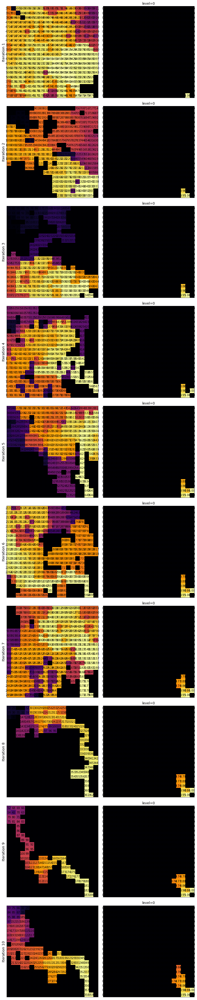

In [307]:
f, ax = plt.subplots(steps, n_levels + 1, figsize=(5*(n_levels + 1), 5*steps))
for y, ims in enumerate(images):
    
    for i, c in enumerate(ims):
        ax[y, i].imshow(c, cmap=plt.cm.inferno)
        
        rows, columns = np.meshgrid(np.arange(len(c)), np.arange(len(c)))
        for v, row, col in zip(c.ravel(), rows.flatten(), columns.flatten()):
            if i == 0:
                ax[y, i].text(row, col, f'{int(v)}', va='center', ha='center')
            else:
                ax[y, i].text(row, col, f'{v:.2f}', va='center', ha='center')
        
        if i != 0:
            ax[y, i].set_title(f'level={i-1}')
        
        ax[y, i].set_xticks([])
        ax[y, i].set_yticks([])
        
        if i == 0:
            ax[y, i].set_ylabel(f'Iteration {y+1}', fontsize=13)

plt.tight_layout()
plt.plot()

[]

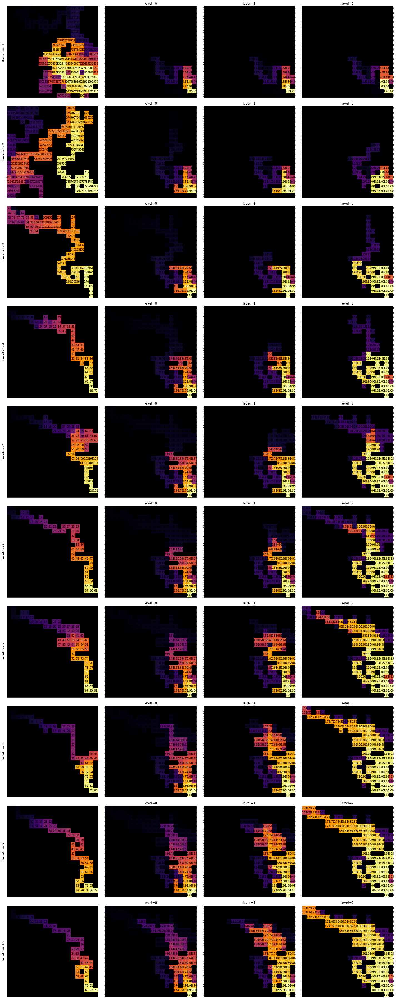

In [273]:
f, ax = plt.subplots(steps, n_levels + 1, figsize=(5*(n_levels + 1), 5*steps))
for y, ims in enumerate(images):
    
    for i, c in enumerate(ims):
        ax[y, i].imshow(c, cmap=plt.cm.inferno)
        
        rows, columns = np.meshgrid(np.arange(len(c)), np.arange(len(c)))
        for v, row, col in zip(c.ravel(), rows.flatten(), columns.flatten()):
            if i == 0:
                ax[y, i].text(row, col, f'{int(v)}', va='center', ha='center')
            else:
                ax[y, i].text(row, col, f'{v:.2f}', va='center', ha='center')
        
        if i != 0:
            ax[y, i].set_title(f'level={i-1}')
        
        ax[y, i].set_xticks([])
        ax[y, i].set_yticks([])
        
        if i == 0:
            ax[y, i].set_ylabel(f'Iteration {y+1}', fontsize=13)

plt.tight_layout()
plt.plot()

[]

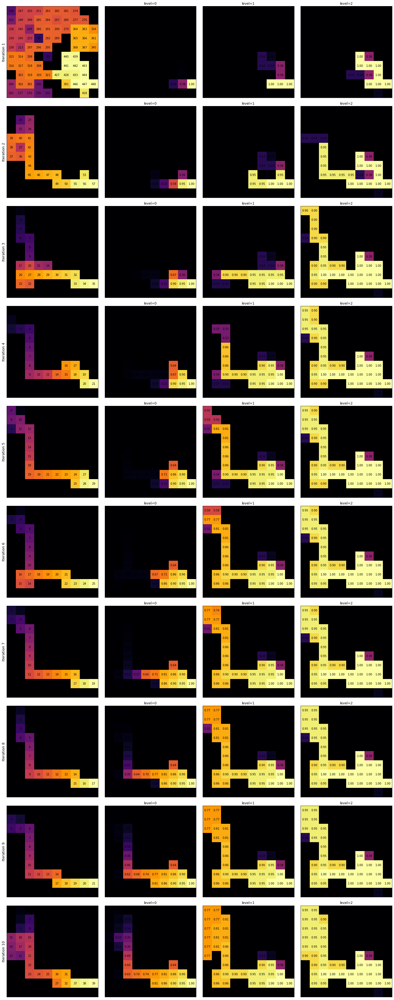

In [25]:
f, ax = plt.subplots(steps, n_levels + 1, figsize=(5*(n_levels + 1), 5*steps))
for y, ims in enumerate(images):
    
    for i, c in enumerate(ims):
        ax[y, i].imshow(c, cmap=plt.cm.inferno)
        
        rows, columns = np.meshgrid(np.arange(len(c)), np.arange(len(c)))
        for v, row, col in zip(c.ravel(), rows.flatten(), columns.flatten()):
            if i == 0:
                ax[y, i].text(row, col, f'{int(v)}', va='center', ha='center')
            else:
                ax[y, i].text(row, col, f'{v:.2f}', va='center', ha='center')
        
        if i != 0:
            ax[y, i].set_title(f'level={i-1}')
        
        ax[y, i].set_xticks([])
        ax[y, i].set_yticks([])
        
        if i == 0:
            ax[y, i].set_ylabel(f'Iteration {y+1}', fontsize=13)

plt.tight_layout()
plt.plot()

[]

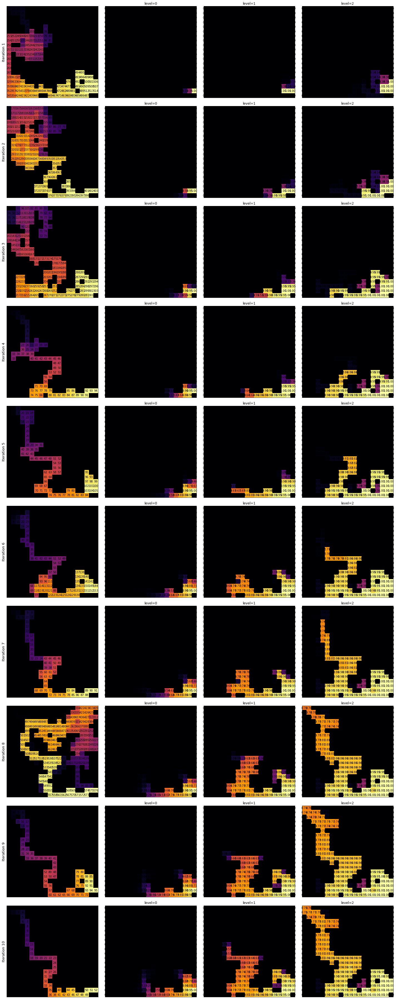

In [581]:
f, ax = plt.subplots(steps, n_levels + 1, figsize=(5*(n_levels + 1), 5*steps))
for y, ims in enumerate(images):
    
    for i, c in enumerate(ims):
        ax[y, i].imshow(c, cmap=plt.cm.inferno)
        
        rows, columns = np.meshgrid(np.arange(len(c)), np.arange(len(c)))
        for v, row, col in zip(c.ravel(), rows.flatten(), columns.flatten()):
            if i == 0:
                ax[y, i].text(row, col, f'{int(v)}', va='center', ha='center')
            else:
                ax[y, i].text(row, col, f'{v:.2f}', va='center', ha='center')
        
        if i != 0:
            ax[y, i].set_title(f'level={i-1}')
        
        ax[y, i].set_xticks([])
        ax[y, i].set_yticks([])
        
        if i == 0:
            ax[y, i].set_ylabel(f'Iteration {y+1}', fontsize=13)

plt.tight_layout()
plt.plot()

[]

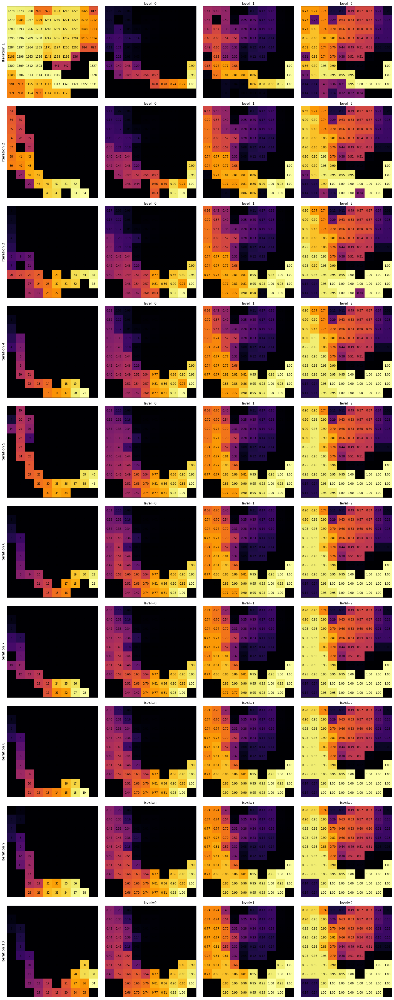

In [323]:
f, ax = plt.subplots(steps, n_levels + 1, figsize=(5*(n_levels + 1), 5*steps))
for y, ims in enumerate(images):
    
    for i, c in enumerate(ims):
        ax[y, i].imshow(c, cmap=plt.cm.inferno)
        
        rows, columns = np.meshgrid(np.arange(len(c)), np.arange(len(c)))
        for v, row, col in zip(c.ravel(), rows.flatten(), columns.flatten()):
            if i == 0:
                ax[y, i].text(row, col, f'{int(v)}', va='center', ha='center')
            else:
                ax[y, i].text(row, col, f'{v:.2f}', va='center', ha='center')
        
        if i != 0:
            ax[y, i].set_title(f'level={i-1}')
        
        ax[y, i].set_xticks([])
        ax[y, i].set_yticks([])
        
        if i == 0:
            ax[y, i].set_ylabel(f'Iteration {y+1}', fontsize=13)

plt.tight_layout()
plt.plot()

[]

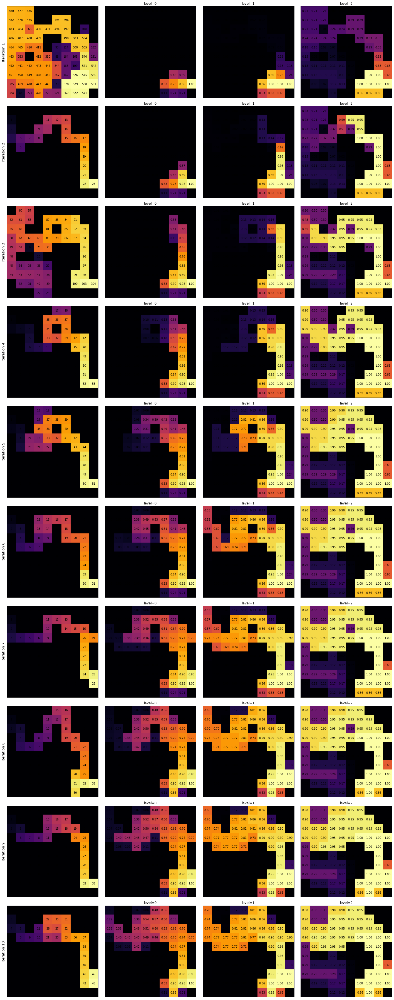

In [238]:
f, ax = plt.subplots(steps, n_levels + 1, figsize=(5*(n_levels + 1), 5*steps))
for y, ims in enumerate(images):
    
    for i, c in enumerate(ims):
        ax[y, i].imshow(c, cmap=plt.cm.inferno)
        
        rows, columns = np.meshgrid(np.arange(len(c)), np.arange(len(c)))
        for v, row, col in zip(c.ravel(), rows.flatten(), columns.flatten()):
            if i == 0:
                ax[y, i].text(row, col, f'{int(v)}', va='center', ha='center')
            else:
                ax[y, i].text(row, col, f'{v:.2f}', va='center', ha='center')
        
        if i != 0:
            ax[y, i].set_title(f'level={i-1}')
        
        ax[y, i].set_xticks([])
        ax[y, i].set_yticks([])
        
        if i == 0:
            ax[y, i].set_ylabel(f'Iteration {y+1}', fontsize=13)

plt.tight_layout()
plt.plot()

[]

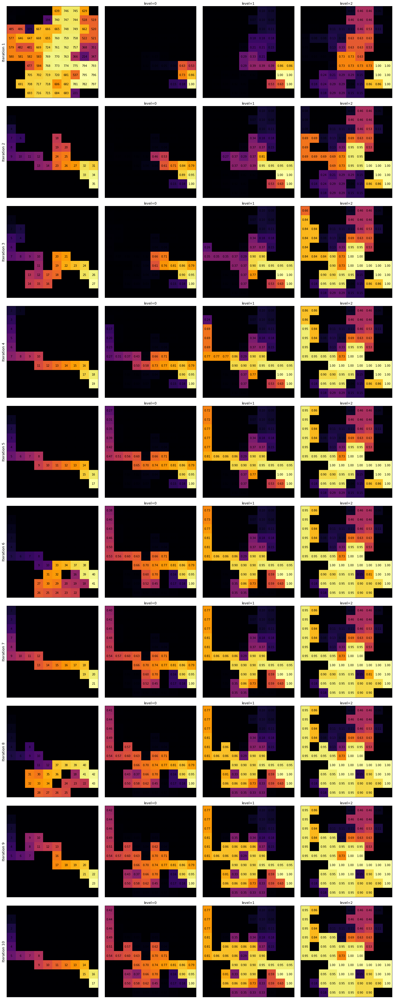

In [607]:
f, ax = plt.subplots(steps, n_levels + 1, figsize=(5*(n_levels + 1), 5*steps))
for y, ims in enumerate(images):
    
    for i, c in enumerate(ims):
        ax[y, i].imshow(c, cmap=plt.cm.inferno)
        
        rows, columns = np.meshgrid(np.arange(len(c)), np.arange(len(c)))
        for v, row, col in zip(c.ravel(), rows.flatten(), columns.flatten()):
            if i == 0:
                ax[y, i].text(row, col, f'{int(v)}', va='center', ha='center')
            else:
                ax[y, i].text(row, col, f'{v:.2f}', va='center', ha='center')
        
        if i != 0:
            ax[y, i].set_title(f'level={i-1}')
        
        ax[y, i].set_xticks([])
        ax[y, i].set_yticks([])
        
        if i == 0:
            ax[y, i].set_ylabel(f'Iteration {y+1}', fontsize=13)

plt.tight_layout()
plt.plot()

[]

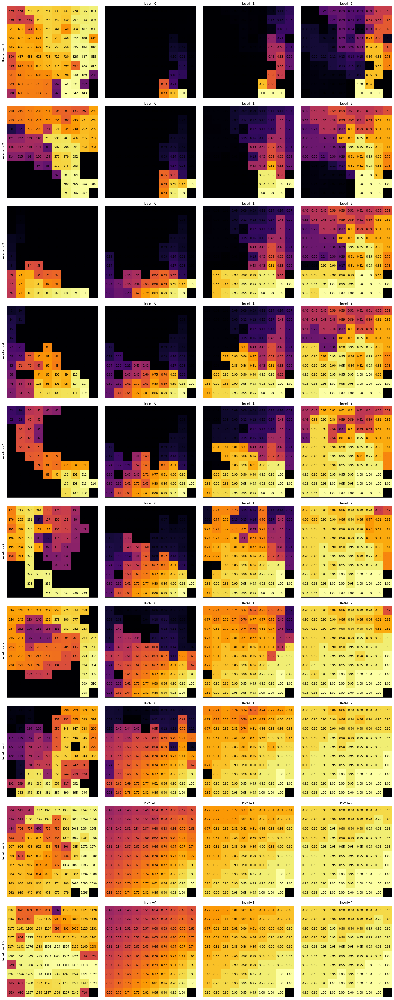

In [597]:
f, ax = plt.subplots(steps, n_levels + 1, figsize=(5*(n_levels + 1), 5*steps))
for y, ims in enumerate(images):
    
    for i, c in enumerate(ims):
        ax[y, i].imshow(c, cmap=plt.cm.inferno)
        
        rows, columns = np.meshgrid(np.arange(len(c)), np.arange(len(c)))
        for v, row, col in zip(c.ravel(), rows.flatten(), columns.flatten()):
            if i == 0:
                ax[y, i].text(row, col, f'{int(v)}', va='center', ha='center')
            else:
                ax[y, i].text(row, col, f'{v:.2f}', va='center', ha='center')
        
        if i != 0:
            ax[y, i].set_title(f'level={i-1}')
        
        ax[y, i].set_xticks([])
        ax[y, i].set_yticks([])
        
        if i == 0:
            ax[y, i].set_ylabel(f'Iteration {y+1}', fontsize=13)

plt.tight_layout()
plt.plot()

[]

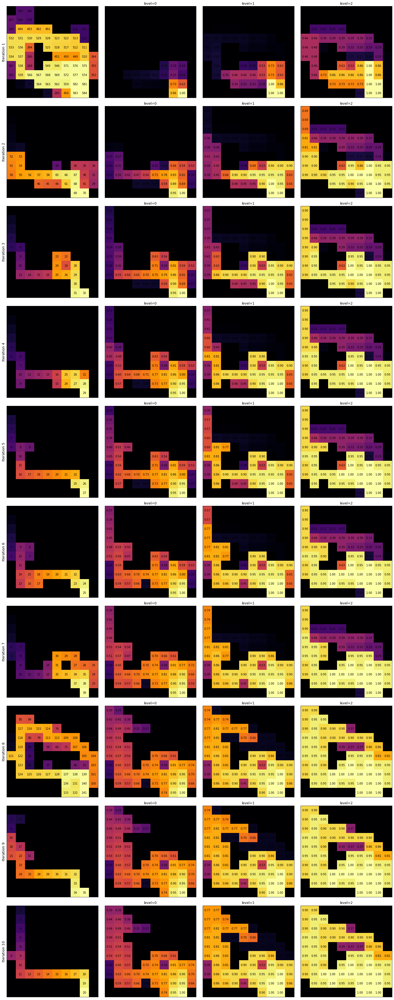

In [533]:
f, ax = plt.subplots(steps, n_levels + 1, figsize=(5*(n_levels + 1), 5*steps))
for y, ims in enumerate(images):
    
    for i, c in enumerate(ims):
        ax[y, i].imshow(c, cmap=plt.cm.inferno)
        
        rows, columns = np.meshgrid(np.arange(len(c)), np.arange(len(c)))
        for v, row, col in zip(c.ravel(), rows.flatten(), columns.flatten()):
            if i == 0:
                ax[y, i].text(row, col, f'{int(v)}', va='center', ha='center')
            else:
                ax[y, i].text(row, col, f'{v:.2f}', va='center', ha='center')
        
        if i != 0:
            ax[y, i].set_title(f'level={i-1}')
        
        ax[y, i].set_xticks([])
        ax[y, i].set_yticks([])
        
        if i == 0:
            ax[y, i].set_ylabel(f'Iteration {y+1}', fontsize=13)

plt.tight_layout()
plt.plot()

[]

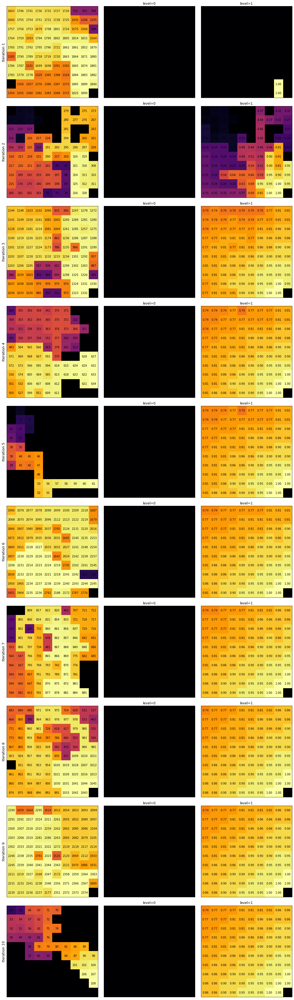

In [454]:
f, ax = plt.subplots(steps, n_levels + 1, figsize=(5*(n_levels + 1), 5*steps))
for y, ims in enumerate(images):
    
    for i, c in enumerate(ims):
        ax[y, i].imshow(c, cmap=plt.cm.inferno)
        
        rows, columns = np.meshgrid(np.arange(len(c)), np.arange(len(c)))
        for v, row, col in zip(c.ravel(), rows.flatten(), columns.flatten()):
            if i == 0:
                ax[y, i].text(row, col, f'{int(v)}', va='center', ha='center')
            else:
                ax[y, i].text(row, col, f'{v:.2f}', va='center', ha='center')
        
        if i != 0:
            ax[y, i].set_title(f'level={i-1}')
        
        ax[y, i].set_xticks([])
        ax[y, i].set_yticks([])
        
        if i == 0:
            ax[y, i].set_ylabel(f'Iteration {y+1}', fontsize=13)

plt.tight_layout()
plt.plot()

[]

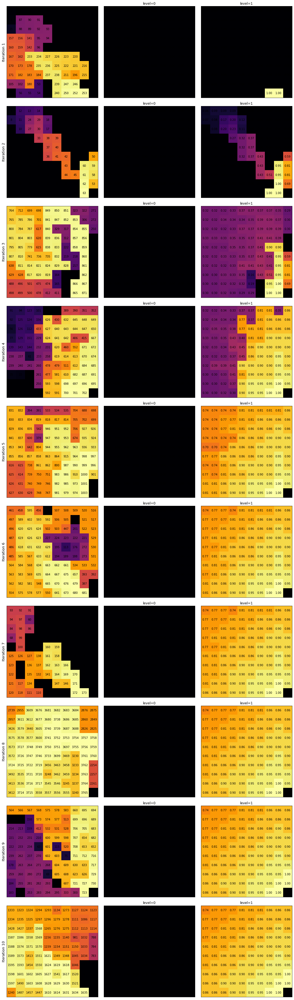

In [452]:
f, ax = plt.subplots(steps, n_levels + 1, figsize=(5*(n_levels + 1), 5*steps))
for y, ims in enumerate(images):
    
    for i, c in enumerate(ims):
        ax[y, i].imshow(c, cmap=plt.cm.inferno)
        
        rows, columns = np.meshgrid(np.arange(len(c)), np.arange(len(c)))
        for v, row, col in zip(c.ravel(), rows.flatten(), columns.flatten()):
            if i == 0:
                ax[y, i].text(row, col, f'{int(v)}', va='center', ha='center')
            else:
                ax[y, i].text(row, col, f'{v:.2f}', va='center', ha='center')
        
        if i != 0:
            ax[y, i].set_title(f'level={i-1}')
        
        ax[y, i].set_xticks([])
        ax[y, i].set_yticks([])
        
        if i == 0:
            ax[y, i].set_ylabel(f'Iteration {y+1}', fontsize=13)

plt.tight_layout()
plt.plot()